In [6]:
# Use the dicts generated by create_dicts.py

import numpy as np
import os
import json
from functions import *
import statistics as stat
import matplotlib.pyplot as plt
from matplotlib import rc
import pandas as pd
import seaborn as sns
from statsmodels.nonparametric.kernel_density import KDEMultivariate
import matplotlib.tri as tri
import cv2
import statistics as stats
from tqdm import tqdm



import pandas as pd
import scipy.stats as st
from sklearn.datasets import make_blobs
from scipy.optimize import minimize
import seaborn as sns

from sklearn.metrics import mean_absolute_error as mae


%matplotlib inline


from tqdm import tqdm
#import create_dicts
# ------- my personal graphing style --------------------

#plt.style.use('ggplot')

# golden_mean = (np.sqrt(5)-1.0)/2.0 # Aesthetic ratio
# fig_width = 8. # Width in inches
# fig_height = 1.1*fig_width*golden_mean # Height in inches
# fig_size = [fig_width,fig_height] # Figure size
# params = {'backend': 'pdf',
# 'legend.fontsize': 14,
# 'xtick.labelsize' : 14,
# 'ytick.labelsize' : 14,
# 'axes.labelsize' : 16,
# 'figure.figsize': fig_size}
# plt.rcParams.update(params)
# rc("font", **{"size": 10, "family": "serif", "serif": ["Computer Modern"]})
# rc("text", usetex=True)
# # -------------------------------------------------------

golden_mean = (np.sqrt(5)-1.0)/2.0 # Aesthetic ratio
fig_width = 8. # Width in inches
fig_height = 1.1*fig_width*golden_mean # Height in inches
fig_size = [fig_width,fig_height] # Figure size
params = {'backend': 'pdf',
'legend.fontsize': 14,
'xtick.labelsize' : 14,
'ytick.labelsize' : 14,
'axes.labelsize' : 16,
'figure.figsize': fig_size}
plt.rcParams.update(params)
rc("font", **{"size": 10, "family": "serif", "serif": ["Computer Modern"]})
rc("text", usetex=True)

# -------------------------------------------------------

# Functions 

In [2]:
max_z = 1.1997789183067033e-06
min_z = 2.080361024513692e-09

In [3]:

# max_z = 1.1997789183067033e-06
# min_z = 2.080361024513692e-09


# # Normalization function using max and min
# def normalize_DRB(z):
#     tmax = 5.78
#     tmin = 2.14
#     z_norm = (tmax-tmin)*(z - min_z)/(max_z-min_z) + tmin
#     return z_norm



def normalize_DRB_vis(z):

    z_norm = (z - min_z)/(max_z-min_z) 
    return z_norm

# def normalize_13(z):
#     max_13 = 3
#     min_13 = 1
#     z_norm = (z - min_13) ((tmax−tmin)+tmin )/(max_13-min_13)
#     return z_norm


# def normalize_skl(z):

#     tmax = 5.98
#     tmin = 2.14
#     z_norm = (tmax-tmin)*(z - min_z_skl)/(max_z_skl-min_z_skl) + tmin

#     return z_norm

# def stats_KDE_plot(X,Y):
#     # Kernel density estimation (statsmodels)
#     model = KDEMultivariate(X, Y, 'cc', bw='normal_reference')  
#     # cross validation maximum likelihood bandwidth selection
#     print('Bandwidth:', model.bw)
#     zi = model.pdf()

#     # Triangulation with refinement
#     triang = tri.Triangulation(X[:250], Y[:250])
#     refiner = tri.UniformTriRefiner(triang)
#     tri_refi, z_refi = refiner.refine_field(zi, subdiv=5)  # three levels of subdivisions
#     # Graphical visualization
#     plt.clf()
#     fig, ax = plt.subplots()
#     ax.invert_yaxis()
#     ax.set_title('Bivariate Standardized Normal Distribution')
#     ax.triplot(triang, color='white', lw=0.5)
#     cax = ax.tricontourf(tri_refi, z_refi, 16, cmap=plt.cm.GnBu)
#     ax.tricontour(tri_refi, z_refi, 16, colors=['0.25', '0.5', '0.5', '0.5'], 
#                 linewidths=[1.0, 0.5, 1.0, 0.5])
#     cbar = fig.colorbar(cax)
#     ax.set_xlabel('x')
#     ax.set_ylabel('y')
#     plt.tight_layout()
#     plt.savefig("statsmodels_kde.pdf", format="pdf", bbox_inches="tight")
    

# Get Coords from one txt

In [5]:
videos = r"C:\Users\USER\OneDrive - Stellenbosch University\Masters\Thesis\virtual_envs\coldb_files\four_models\Cascade R-CNN_V3"


from cProfile import label
from locale import normalize
# Normalization function using max and min
# def normalize(z):
#     z_norm = (z - min_z)/(max_z-min_z)
#     return z_norm

# Government variables
all_max = []
all_min = [] 
all_max_skl =[]
all_min_skl = []   

bw_ist_0 = []
bw_ist_1 =[]
data_dict = {}


for video in os.listdir(videos):
   

    if video not in ["Altitude_videos","Circle_vid","dicts","val"]:

        # Create name for txt
        gt = video.split("-")[1]

        # Try to remove space before gt (( eg: DJI_0808 -" "1200))
        try:
            gt = gt.split(" ")[1]

        except: 
            # Does nothing
            hold = 1

        txt = os.path.join(video,"frame_9_!"+gt+".txt")
        path = os.path.join(videos,txt)


        # Variables for each txt
        co_and_prob = []
        x_data = []
        y_data = []
        p_data = []

        # Get ALL results for the current txt

        results = get_results(path)
        last = len(results)

        # generate data for KDE mode
        for i in range(int(last/5)):
            five = list(results[0:5])

            # Calculate centers of BB
            xt = int(five[0])
            yt = int(five[1])
            xb = int(five[2])
            yb = int(five[3])
            xcp = int((xb+xt)/2)
            ycp = int((yb+yt)/2)

            
            center = [xcp,ycp]

            prob = five[4]

            if prob <= 1:
                if prob  > 0.05:

                    p_data.append(prob)
                    x_data.append(xcp)
                    y_data.append(ycp)

            # Create 
            coord_prob = [center,p_data]
            co_and_prob.append(coord_prob)

            # removing the 5 elements appended to co_and_prob 
            for y in [1,2,3,4,5]:
                results.pop(0)

        # Generate KDE model from data
        #try:
        # KDE with stats models
        model = KDEMultivariate([x_data, y_data], 'cc', bw=np.array([50, 50]))#np.array([304, 304])) 
        z_data = model.pdf([x_data,y_data])
        # print(str(video) + " -- " + str(model.bw))
        # bw_ist_0.append(model.bw[0])
        # bw_ist_1.append(model.bw[1])

        # KDE with sklearn    
        values = np.vstack([x_data, y_data])
        model_skl = st.gaussian_kde(values, bw_method=0.4)

        
        z_data_skl = model_skl.pdf([x_data,y_data])

        # ax.invert_yaxis()
        # ax.scatter3D(x_data,y_data,normalize_DRB(z_data),label=video)
        # #ax.scatter3D(X_tb[:max_num],Y_tb[:max_num],P_new[:max_num],label="Probability")
        # ax.legend()

        # ax.set_xlabel("X")
        # ax.set_ylabel("Y")
        # ax.set_zlabel("Z")

        # ax.view_init(30,45)

        # except:
        #     print("Not enough data for video " + video)
            
        # Generate Z data 

        data_dict[video] = [x_data,y_data,z_data,p_data,z_data_skl]
        # Get max and min of z_data for statsm
        z_max = max(z_data)
        z_min = min(z_data)

        z_max_skl = max(z_data_skl)
        z_min_skl = min(z_data_skl)

        # Append max and min to global max and min
        all_max.append(z_max)   
        all_min.append(z_min) 

        all_max_skl.append(z_max_skl)   
        all_min_skl.append(z_min_skl) 
        
## print out goverment max
print("StatsM")
max_z = max(all_max)
min_z = min(all_min)
print("Max z = ",max_z)
print("Min z = ",min_z)

print("SKL")
max_z_skl = max(all_max_skl)
min_z_skl = min(all_min_skl)
print("Max z = ",max_z_skl)
print("Min z = ",min_z_skl)

StatsM
Max z =  1.435191968363281e-05
Min z =  4.381416189728709e-08
SKL
Max z =  4.027026284512776e-06
Min z =  3.0388608535602266e-09


In [7]:
bw_1_avg = stat.mean(bw_ist_1)
bw_0_avg = stat.mean(bw_ist_0)


StatisticsError: mean requires at least one data point

In [ ]:
# Max z =  1.8656478117607638e-06
# Min z =  2.826342988779994e-09

# 3D scatter plot of Z and P

In [4]:
X_tb,Y_tb,Z_tb,P_tb = data_dict['DJI_0779 - 1130']
P_new = P_tb + normalize(Z_tb)

ValueError: too many values to unpack (expected 4)

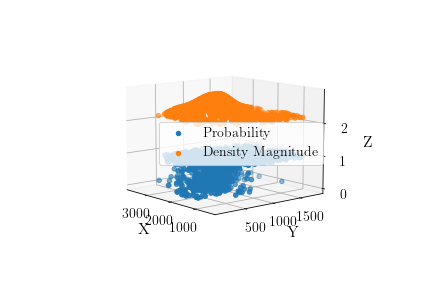

In [5]:


from cProfile import label


X_tb,Y_tb,Z_tb,P_tb,Z_skl = data_dict['DJI_0820 - 937']
#fig = plt.figure()max_num = len(X_tb)
# ax = plt.axes(projection='3d')
fig = plt.figure()
ax = fig.add_subplot(111,projection='3d')




ax.invert_yaxis()
ax.invert_yaxis()
ax.scatter3D(X_tb,Y_tb,P_tb,label="Probability")
ax.scatter3D(X_tb,Y_tb,normalize_DRB(Z_tb),label="Density Magnitude")
#ax.scatter3D(X_tb[:max_num],Y_tb[:max_num],P_tb[:max_num]*normalize_DRB(Z_tb[:max_num]),label="Scaled Prob")
#ax.scatter3D(X_tb[:max_num],Y_tb[:max_num],(Z_skl[:max_num]),label="skl")
#ax.scatter3D(X_tb,Y_tb,P_new,label="Probability")
ax.grid()
ax.legend(loc = 7)


ax.set_xlabel("X")
ax.set_ylabel("Y")
ax.set_zlabel("Z")

ax.view_init(10,-40)
plt.savefig("3d_test.fig", format="pdf", bbox_inches="tight")



<Figure size 1152x648 with 0 Axes>

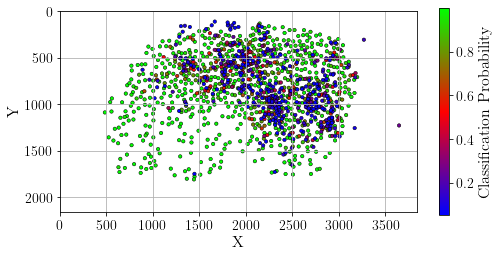

<Figure size 576x391.586 with 0 Axes>

In [11]:
import matplotlib.pyplot as plt
import numpy as np
fig = plt.figure(figsize=(16, 9))
# Generate sample data
n = 100

plt.clf()

# Create a color map for each set of data
# cmap1 = plt.cm.Reds
# cmap2 = plt.cm.Reds
X_tb,Y_tb,Z_tb,P_tb,Z_skl = data_dict['DJI_0820 - 937']
# Normalize the data to the range of the color map for each set


# Create the scatter plot for the first set of data
fig, ax = plt.subplots()
plt.grid()
# sc2 = ax.scatter(X_tb, Y_tb, c=Z_tb, cmap='brg', marker="o", s=1,edgecolor = 'k',linewidths=0.5)
sc1 = ax.scatter(X_tb, Y_tb, c=P_tb, cmap='brg', marker="o", s=12,edgecolor = 'k',linewidths=0.5)

cbar1 = plt.colorbar(sc1, ax=ax, shrink=0.7)
# cbar2 = plt.colorbar(sc2, ax=ax, shrink=0.7)
cbar1.set_label('Classification Probability')
# cbar2.set_label('Density')



plt.axis('scaled')

ax.set_xlim(0, 3840)
ax.set_ylim(0, 2160)
# Add labels and title to the plot
ax.set_xlabel('X')
ax.set_ylabel('Y')
plt.gca().invert_yaxis()

plt.savefig("density4.pdf", format="pdf", bbox_inches="tight")
plt.show()
plt.clf()

<Figure size 576x391.586 with 0 Axes>

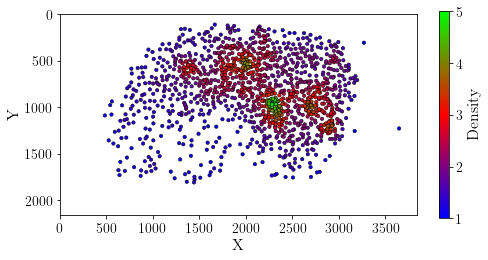

<Figure size 576x391.586 with 0 Axes>

In [9]:
X_tb,Y_tb,Z_tb,P_tb,Z_skl = data_dict['DJI_0820 - 937']
# Normalize the data to the range of the color map for each set
%run functions.py

# Create the scatter plot for the first set of data
fig, ax = plt.subplots()
# sc2 = ax.scatter(X_tb, Y_tb, c=Z_tb, cmap='brg', marker="o", s=1,edgecolor = 'k',linewidths=0.5)
sc1 = ax.scatter(X_tb, Y_tb, c=normalize_DRB(Z_tb,5,1), cmap='brg', marker="o", s=12,edgecolor = 'k',linewidths=0.5)

cbar1 = plt.colorbar(sc1, ax=ax, shrink=0.7)
# cbar2 = plt.colorbar(sc2, ax=ax, shrink=0.7)
cbar1.set_label('Density')
# cbar2.set_label('Density')



plt.axis('scaled')

ax.set_xlim(0, 3840)
ax.set_ylim(0, 2160)
# Add labels and title to the plot
ax.set_xlabel('X')
ax.set_ylabel('Y')
plt.gca().invert_yaxis()
# Show the plo

plt.savefig("density_5.pdf", format="pdf", bbox_inches="tight")
plt.show()
plt.clf()

In [54]:
# set seaborn style
sns.set_style("white")

# Basic 2D density plot
sns.kdeplot(x=df.sepal_width, y=df.sepal_length)
plt.show()
 
# Custom the color, add shade and bandwidth
sns.kdeplot(x=df.sepal_width, y=df.sepal_length, cmap="Reds", shade=True, bw_adjust=.5)
plt.show()

# Add thresh parameter
sns.kdeplot(x=df.sepal_width, y=df.sepal_length, cmap="Blues", shade=True, thresh=0)
plt.show()

NameError: name 'df' is not defined

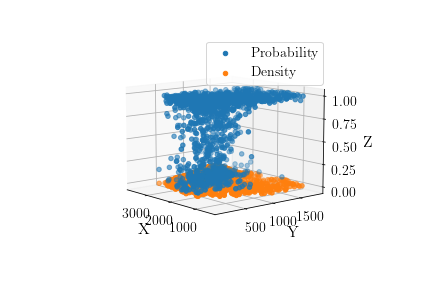

In [9]:
%matplotlib widget
from cProfile import label
from mpl_toolkits.mplot3d import Axes3D

X_tb,Y_tb,Z_tb,P_tb,Z_skl = data_dict['DJI_0820 - 937']
#fig = plt.figure()
max_num = len(X_tb)
ax = plt.axes(projection='3d')


ax.invert_yaxis()
ax.invert_yaxis()

#ax.get_proj = lambda: np.dot(Axes3D.get_proj(ax), np.diag([2, 2, 5, 1]))


ax.scatter3D(X_tb[:max_num],Y_tb[:max_num],P_tb[:max_num],label="Probability")
ax.scatter3D(X_tb[:max_num],Y_tb[:max_num],normalize_DRB_vis(Z_tb[:max_num]),label="Density")
#ax.scatter3D(X_tb[:max_num],Y_tb[:max_num],(Z_skl[:max_num]),label="skl")

#ax.scatter3D(X_tb[:max_num],Y_tb[:max_num],P_new[:max_num],label="Probability")
ax.legend()

ax.set_xlabel("X")
ax.set_ylabel("Y")
ax.set_zlabel("Z")

ax.view_init(10,-40)
#plt.savefig("3d.pdf", format="pdf", bbox_inches="tight")

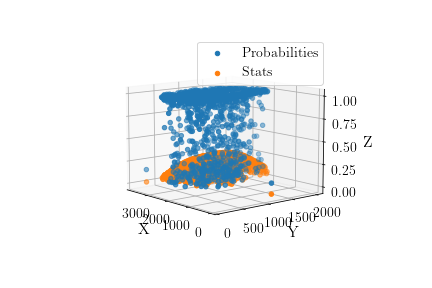

In [27]:
%matplotlib widget
from cProfile import label

X_ = []
Y_ = []

X_tb,Y_tb,Z_tb,P_tb,Z_skl = data_dict['DJI_0841-1003']
#fig = plt.figure()
max_num = len(X_tb)
ax = plt.axes(projection='3d')


ax.invert_yaxis()
ax.invert_yaxis()

# for i in range(len((Z_tb[:max_num]))):
#     if normalize_DRB_vis(Z_tb[:max_num]) > 0.5:

# Z_ = normalize_DRB_vis(Z_tb) > 0.5
# print(Z_.shape)
# indices = np.nonzero(normalize_DRB_vis(Z_tb) > 0.5)

# for i in indices[0]:

#     X_.append(X_tb[i])
#     Y_.append(Y_tb[i])
      
# X_ = np.array(X_)
# Y_ = np.array(Y_)
# print(X_.shape)
# print(Y_.shape)
X_tb = np.array(X_tb)
Y_tb = np.array(Y_tb)
P_tb = np.array(P_tb)
ZZ = normalize_DRB_vis(Z_tb) 
#ax.scatter3D(X_tb,Y_tb,P_tb,label="Probability")
ax.scatter3D(X_tb, Y_tb, (P_tb),label="Probabilities")
ax.scatter3D(X_tb,Y_tb,normalize_DRB_vis(Z_tb),label="Stats")

#ax.scatter3D(X_tb[(ZZ >0.5) & (P_tb <0.4)], Y_tb[(ZZ >0.5) & (P_tb <0.4)], (P_tb[(ZZ >0.5) & (P_tb <0.4)]),label="Filter")

#ax.scatter3D(X_tb[:max_num],Y_tb[:max_num],(Z_skl[:max_num]),label="SKL")
#ax.scatter3D(X_tb[:max_num],Y_tb[:max_num],P_new[:max_num],label="Probability")
ax.legend()

ax.set_xlabel("X")
ax.set_ylabel("Y")
ax.set_zlabel("Z")

ax.view_init(10,-40)

plt.savefig("3d.pdf", format="pdf", bbox_inches="tight")

In [51]:
indices[0][5]

207

In [11]:
sheeps = P_new
count =  0
for sheep in sheeps:
    if sheep > 0.8:
        count +=1
print("new Sheep count: ",count)
sheeps = P_tb
count =  0
for sheep in sheeps:
    if sheep > 0.8:
        count +=1
print("Sheep count: ",count)

new Sheep count:  1018
Sheep count:  825


# Local threshold summation

In [49]:
videos = r"C:\Users\USER\OneDrive - Stellenbosch University\Masters\Thesis\virtual_envs\coldb_files\four_models\Cascade R-CNN_V3"

# Counting threshold
#threshold = 0.95
scale_dict = {}
scale_error_mean = np.array([])
#threshold = 0.78#np.linspace(1,4,10)
#custome_bw = np.array([200,  200])


# def normalize_DRB(z):
#     tmax = 8
#     tmin = 2
#     z_norm = (tmax-tmin)*(z - min_z)/(max_z-min_z) + tmin
#     return z_norm




def objective(x): #function used for optimization
    first =True
    # Variable to optimize 
    tmin = 2.14
    tmax = 5.87
    threshold = 0.78
    bl_threshold = 0.78
    frame_num=1
    #threshold = 0.78

    # Dictionary to store results (error, count etc) for each video
    video_dict = {}
    video_errors = []
    video_errors_baseline =[]
    video_errors_LDPS = []
    video_errors_skl = []
    ground_truths = []
    base_line_counts = []
    LDPS_counts = []
    densities = []
    # loop through each video
    for video in tqdm(os.listdir(videos)):

        videos_path = os.path.join(videos,video)
        if video not in ["Altitude_videos","Circle_vid","dicts","val",'DJI_0830-522']:

            # define a list for all the counts made in a video - the average of this count is the final video count
            video_counts =[]
            video_counts_stats = []
            video_counts_skl = []

            # Create name for txt
            gt = int(video.split("-")[1])
            # Try to remove space before gt (( eg: DJI_0808 -" "1200))
            try:
                gt = int(gt.split(" ")[1])

            except: 
                # Does nothing
                hold = 1

            # Declare limit vairable for to limit the number of frames used per video     
            limit = 0

            # Get ALL results for the current txt
            for frame in os.listdir(videos_path):

                # lists for each frame
                x_data = np.array([])
                y_data = np.array([])
                p_data = np.array([])
                p_scaled = np.array([])

                # only use X frames in video
                if limit < frame_num:

                    # Reset the count for each frame
                    count = 0
                    count_stats = 0
                    count_skl = 0

                    p_scaled_stats = np.array([])
                    p_scaled_skl = np.array([])

                    # Join path
                    frame_path = os.path.join(videos_path,frame)

                    results = get_results(frame_path)
                    last = len(results)

                    # generate data for KDE mode
                    for i in range(int(last/5)):
                        # get the first five elements in results
                        five = list(results[0:5])

                        # Calculate centers of BB
                        xt = int(five[0])
                        yt = int(five[1])
                        xb = int(five[2])
                        yb = int(five[3])
                        xcp = int((xb+xt)/2)
                        ycp = int((yb+yt)/2)


                        prob = five[4]

                        if prob < 1:
                            # ignores detections with probabilities less that 0.05 (5%)
                            if prob  > 0.05:
                                p_data = np.append(p_data,prob)
                                x_data = np.append(x_data,xcp)
                                y_data = np.append(y_data,ycp)


                        # removing the first 5 elements - (their data have been captured) 
                        for y in [1,2,3,4,5]:
                            results.pop(0)

                    # Generate KDE model from data
                    # try:
                    #     # Statsmodels 
                    model = KDEMultivariate([x_data, y_data], 'cc', bw=np.array([x[0],x[1]]))
                    
                    # Sklearn 
                    # values = np.vstack([x_data, y_data])
                    # model_skl = st.gaussian_kde(values, bw_method = 'silverman') 
                    
                    # except:
                    #     print("Not enough data for video " + video)
                        
                    # Generate Z data for each frame
                    z_data = model.pdf([x_data,y_data])
                    # z_data_skl = model_skl.pdf([x_data,y_data])

                    # normalize Z ( ensure that z falls between 0-1 and have the same datum)
                    z_norm = (tmax-tmin)*(z_data - min_z)/(max_z-min_z) + tmin
                    #z_norm = normalize_DRB(z_data)
                    #z_norm_skl = normalize_skl(z_data_skl)
                    
                    # STATS --------------------
                    #Scale P_data - only scale p if z_norm is greater than a specified value
                    for i in range(len(z_norm)):
                        if z_norm[i] >= 0 and gt > 200: 
                            p_scaled_stats = np.append(p_scaled_stats,(p_data[i]*z_norm[i]))
                        else:
                            p_scaled_stats = np.append(p_scaled_stats,p_data[i])

                    #p_scaled = p_data + z_norm*1.05263158
                    # get count for each frame using density information
                    for i in p_scaled_stats:
                        if i >= threshold:
                            count_stats +=1
                    
                    video_counts_stats.append(count_stats)

                    for i in p_scaled_skl:
                        if i >= threshold:
                            count_skl +=1
                    
                    video_counts_skl.append(count_skl)

                    # No density - baseline 
                    for i in p_data:
                        if i >= bl_threshold:
                            count +=1
                    
                    video_counts.append(count)

                    # increment the number of frames limit
                    limit += 1
                    
            
            # Calculate the average of all frame counts
            video_average = stats.mean(video_counts)
            video_average_stats = stats.mean(video_counts_stats)
            base_line_counts.append(video_average)
            LDPS_counts.append(video_average_stats)

            # Calculate the error for each video
            error = abs(gt - video_average)*100/gt
            error_stats = abs(gt - video_average_stats)*100/gt

            # Append error of current video to all video errors
            video_errors_baseline.append(error)
            video_errors_LDPS.append(error_stats)
            ground_truths.append(gt)
            densities.append(np.mean(z_norm))


    return video_errors_baseline, video_errors_LDPS,  ground_truths, frame_num, densities #Variable to minimize

print("DONE")

DONE


# Optimization

In [ ]:
b = (10,800)
bnds = (b,b)
x0 = [600,600] # lower and upper bound initialization

sol = minimize(objective,x0,method="Powell")#,bounds=b)
print(sol)

25.89

# Plot Erros from different KDEs

In [50]:
# Get Data
# basline_errors, LDPS_erros, gts,frame_num = 
#[231.9973513 ,   4.85193669]
basline_errors, LDPS_erros, gts, frame_num, zz = objective([250 ,   250])


100%|██████████| 24/24 [00:06<00:00,  3.55it/s]


In [51]:

#convert lists to np arrays
ground_truths = np.array(gts)
error_baseline = np.array(basline_errors)
error_LDPS = np.array(LDPS_erros)
zz = np.array(zz)



#reorder lists in ascending ground truth order 
arr1inds = ground_truths.argsort()
error_baseline = error_baseline[arr1inds[::-1]]
error_LDPS = error_LDPS[arr1inds[::-1]]
ground_truths = ground_truths[arr1inds[::-1]]
zz = zz[arr1inds[::-1]]

# Plot baseline Errors
error_baseline_alt = error_baseline
plt.clf()
plt.scatter(ground_truths,error_baseline,label = "Baseline")
error_baseline_alt[error_baseline_alt==0] = 10

z = np.polyfit(ground_truths,np.log(error_baseline_alt), 1)
a = np.exp(z[1])
b = z[0]

x_fitted = np.linspace(np.min(ground_truths),np.max(ground_truths),100)
y_fitted = a*np.exp(b*x_fitted)
plt.plot(x_fitted,y_fitted,linestyle='--')


# Plot LDPS Errors
plt.scatter(ground_truths,error_LDPS,label = "LDTS")
z_stats = np.polyfit(ground_truths,error_LDPS, 1)
p_stats = np.poly1d(z_stats)
#plt.plot(ground_truths,p_stats(ground_truths),linestyle='--')

error_LDPS_alt = error_LDPS

error_LDPS_alt[error_LDPS_alt==0] = 1

z = np.polyfit(ground_truths,np.log(error_LDPS_alt), 1)
a = np.exp(z[1])
b = z[0]

x_fitted = np.linspace(np.min(ground_truths),np.max(ground_truths),100)
y_fitted = a*np.exp(b*x_fitted)
plt.plot(x_fitted,y_fitted,linestyle='--')

#plt.scatter(names,error_list_skl,label = "skl")
plt.xticks()
plt.ylabel("Mean Absolute Error")
plt.xlabel("Number of sheep")
plt.grid()
plt.legend()
#plt.gca().invert_xaxis()
plt.savefig("top_probs__dev3.pdf", format="pdf", bbox_inches="tight")
plt.clf()

# Get average errors
print(" ------- Average Errors -------")
print("Baseline:             ", np.mean(error_baseline))
print("Average stat error:   ", np.mean(error_LDPS))
print("Percentage Reduction: ",(np.mean(error_baseline)-np.mean(error_LDPS))*100/np.mean(error_baseline))
print("Number of frames used:",frame_num)



 ------- Average Errors -------
Baseline:              15.70075856721114
Average stat error:    3.5325732504297456
Percentage Reduction:  77.50062052538637
Number of frames used: 1


<Figure size 576x391.586 with 0 Axes>

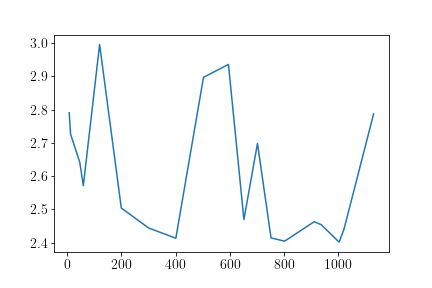

In [63]:
%matplotlib widget
plt.clf()
plt.plot(ground_truths,zz)

# Densities vs classification probabilities 

In [8]:
def get_z(results_1):
    last = len(results_1)
    first = True
    # generate data for KDE mode
    for i in range(int(last/5)):
        # get the first five elements in results
        five = list(results_1[0:5])

        # Calculate centers of BB
        xt = int(five[0])
        yt = int(five[1])
        xb = int(five[2])
        yb = int(five[3])
        xcp = int((xb+xt)/2)
        ycp = int((yb+yt)/2)


        prob = five[4]

        if prob < 1:
            # ignores detections with probabilities less that 0.05 (5%)
            if prob  > 0.05:
                if first:
                    x_data = np.array(xcp)
                    y_data = np.array(ycp)
                    first = False
                else:
                    #p_data = np.append(p_data,prob)
                    x_data = np.append(x_data,xcp)
                    y_data = np.append(y_data,ycp)


        # removing the first 5 elements - (their data have been captured) 
        for y in [1,2,3,4,5]:
            results_1.pop(0)

    # Generate KDE model from data
    # try:
    #     # Statsmodels 
    model = KDEMultivariate([x_data, y_data], 'cc', bw=np.array([350,350]))
    
    # Sklearn 
    # values = np.vstack([x_data, y_data])
    # model_skl = st.gaussian_kde(values, bw_method = 'silverman') 
    
    # except:
    #     print("Not enough data for video " + video)
        
    # Generate Z data for each frame
    z_data = model.pdf([x_data,y_data])
    return z_data

In [9]:
def get_data(name):

    plt.clf()
    vid_dir = r"C:\Users\USER\OneDrive - Stellenbosch University\Masters\Thesis\virtual_envs\coldb_files\four_models\Cascade R-CNN_V3\Circle_vid"


    thresh_val = 0.85
    from tqdm import tqdm
    for vid in os.listdir(vid_dir):
        #if vid != "DJI_0846_circle-1003":
        if vid == name: #['DJI_0851_circle-1021',"DJI_0846_circle-1003"]:
            #for x in tqdm(my_list):
                # do something with x
            GT = vid.split("-")[1]
            frame_dir = os.path.join(vid_dir,vid)    
            frame_dir_list =  os.listdir(frame_dir)   
            top_probs =[]
            z_data = []
            error_list = []

            for i in tqdm(range(len(frame_dir_list))):
                frame = 'frame_'+str(i)+'_!' + GT+'.txt'
                txt_path = os.path.join(frame_dir,frame)
                

                try:
                    results = get_results(txt_path)
                except:
                    print("Invalid argument")
                    print(txt_path)
                #Get probs
                probs = get_probs(results)
                probs = probs[:int(GT)]
                average_of_probs = stat.mean(probs)
                top_probs.append(average_of_probs)

                z = get_z(results)
                
                avg_z = np.mean(z)
                z_data.append(avg_z)

                #Get probs
                
                # get prediction
                pred_count = get_count(probs,thresh_val)
                # calculate error
                error = abs(pred_count-int(GT))#/int(GT)

                #print(probs)
                error_list.append(error)
                #print(probs)
        
            # if vid == "DJI_0851_circle-1021":    
            #     plt.scatter(z_data,top_probs,label="Video A")
            # else:
            #     plt.plot(z_data,top_probs,label="Video B")

    return   error_list, z_data, top_probs    
    #         plt.xlabel("Density")

    #         plt.ylabel("Average Classification Probabilities")
    # plt.grid()  

#plt.savefig("cluster_thresholds_with_z.pdf", format="pdf", bbox_inches="tight")

In [10]:
error_list_1, z_data_1, top_probs_1 = get_data('DJI_0851_circle-1021')


print(len(z_data_1))
print(len(error_list_1))

100%|██████████| 836/836 [02:51<00:00,  4.86it/s]

836
836


<Figure size 576x391.586 with 0 Axes>

In [11]:
error_list_2, z_data_2, top_probs_2 = get_data('DJI_0852_circle-1021')


print(len(z_data_2))
print(len(error_list_2))

100%|██████████| 844/844 [02:23<00:00,  5.88it/s]

844
844


<Figure size 576x391.586 with 0 Axes>

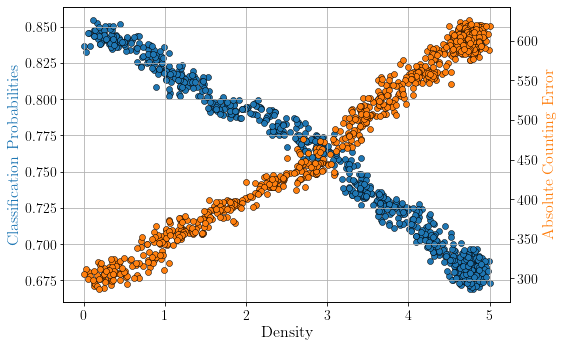

In [20]:
z_data_np = np.array(z_data_1)
z_data = normalize_DRB(z_data_np,5,0.000000001)
fig, ax1 = plt.subplots() 
  
ax1.set_xlabel('Density') 
ax1.set_ylabel('Classification Probabilities', color = 'C0') 
ax1.scatter(z_data, top_probs_1, color = 'C0',edgecolor = 'k',linewidths=0.5) 
#ax1.scatter(z_data_2, top_probs_2, color = 'C0', label= "Video B", marker = '*') 
#ax1.tick_params(axis ='y', color = 'C0') 
  
# Adding Twin Axes



ax2 = ax1.twinx() 
  
ax2.set_ylabel('Absolute Counting Error', color = 'C1') 
ax2.scatter(z_data, error_list_1, color = 'C1',edgecolor = 'k',linewidths=0.5) 
#ax2.scatter(z_data_2, error_list_2, color = 'C1', label= "Video B", marker = '+') 
#ax2.tick_params(axis ='y', color = 'C1') 
 
# Show plot

ax1.grid(None)

plt.savefig("cluster_thresholds_with_z_2y_2.pdf", format="pdf", bbox_inches="tight")
plt.show()

In [12]:
# z_data_np = np.array(z_data)
# top_probs_np = np.array(top_probs)


# arr1inds = z_data_np.argsort()
# z_data_np = z_data_np[arr1inds[::-1]]
# top_probs_np = top_probs_np[arr1inds[::-1]]
%run functions.py
si = 40
plt.scatter(normalize_DRB(z_data_1,5,1),error_list_1,label="Video A",edgecolor = 'k',linewidths=0.5,s=si)
plt.scatter(normalize_DRB(z_data_2,5,1),error_list_2,label="Video B",edgecolor = 'k',linewidths=0.5,s=si)
plt.ylabel("Absolute Counting Error")
plt.xlabel("Average Object Density (obj/pix^2)")
plt.grid()  
plt.legend()
plt.savefig("cluster_thresholds_with_z_error4.pdf", format="pdf", bbox_inches="tight")

RuntimeError: latex was not able to process the following string:
b'Average Object Density (obj/pix^2)'

Here is the full command invocation and its output:

latex -interaction=nonstopmode --halt-on-error --output-directory=tmpgptuz3jz e575e80b368062206f1ac8a7344ef730.tex

This is pdfTeX, Version 3.141592653-2.6-1.40.24 (MiKTeX 22.3) (preloaded format=latex.fmt)
 restricted \write18 enabled.
entering extended mode
(e575e80b368062206f1ac8a7344ef730.tex
LaTeX2e <2022-06-01> pre-release-0 (develop 2022-7-8 branch)
L3 programming layer <2022-06-02>
(C:\Users\USER\AppData\Local\Programs\MiKTeX\tex/latex/base\article.cls
Document Class: article 2021/10/04 v1.4n Standard LaTeX document class
(C:\Users\USER\AppData\Local\Programs\MiKTeX\tex/latex/base\size10.clo))
(C:\Users\USER\AppData\Local\Programs\MiKTeX\tex/latex/type1cm\type1cm.sty)
(C:\Users\USER\AppData\Local\Programs\MiKTeX\tex/latex/cm-super\type1ec.sty
(C:\Users\USER\AppData\Local\Programs\MiKTeX\tex/latex/base\t1cmr.fd))
(C:\Users\USER\AppData\Local\Programs\MiKTeX\tex/latex/base\inputenc.sty)
(C:\Users\USER\AppData\Local\Programs\MiKTeX\tex/latex/geometry\geometry.sty
(C:\Users\USER\AppData\Local\Programs\MiKTeX\tex/latex/graphics\keyval.sty)
(C:\Users\USER\AppData\Local\Programs\MiKTeX\tex/generic/iftex\ifvtex.sty
(C:\Users\USER\AppData\Local\Programs\MiKTeX\tex/generic/iftex\iftex.sty))
(C:\Users\USER\AppData\Local\Programs\MiKTeX\tex/latex/geometry\geometry.cfg))
(C:\Users\USER\AppData\Local\Programs\MiKTeX\tex/latex/underscore\underscore.st
y) (C:\Users\USER\AppData\Local\Programs\MiKTeX\tex/latex/base\textcomp.sty)
(C:\Users\USER\AppData\Local\Programs\MiKTeX\tex/latex/l3backend\l3backend-dvip
s.def)
No file e575e80b368062206f1ac8a7344ef730.aux.
*geometry* driver: auto-detecting
*geometry* detected driver: dvips
! Missing $ inserted.
<inserted text> 
                $
l.30 {\rmfamily Average Object Density (obj/pix^
                                                2)}%
No pages of output.
Transcript written on C:\Users\USER\.matplotlib\tex.cache\e5\75\tmpgptuz3jz\e57
5e80b368062206f1ac8a7344ef730.log.




RuntimeError: latex was not able to process the following string:
b'Average Object Density (obj/pix^2)'

Here is the full command invocation and its output:

latex -interaction=nonstopmode --halt-on-error --output-directory=tmpcjx_wcp4 e575e80b368062206f1ac8a7344ef730.tex

This is pdfTeX, Version 3.141592653-2.6-1.40.24 (MiKTeX 22.3) (preloaded format=latex.fmt)
 restricted \write18 enabled.
entering extended mode
(e575e80b368062206f1ac8a7344ef730.tex
LaTeX2e <2022-06-01> pre-release-0 (develop 2022-7-8 branch)
L3 programming layer <2022-06-02>
(C:\Users\USER\AppData\Local\Programs\MiKTeX\tex/latex/base\article.cls
Document Class: article 2021/10/04 v1.4n Standard LaTeX document class
(C:\Users\USER\AppData\Local\Programs\MiKTeX\tex/latex/base\size10.clo))
(C:\Users\USER\AppData\Local\Programs\MiKTeX\tex/latex/type1cm\type1cm.sty)
(C:\Users\USER\AppData\Local\Programs\MiKTeX\tex/latex/cm-super\type1ec.sty
(C:\Users\USER\AppData\Local\Programs\MiKTeX\tex/latex/base\t1cmr.fd))
(C:\Users\USER\AppData\Local\Programs\MiKTeX\tex/latex/base\inputenc.sty)
(C:\Users\USER\AppData\Local\Programs\MiKTeX\tex/latex/geometry\geometry.sty
(C:\Users\USER\AppData\Local\Programs\MiKTeX\tex/latex/graphics\keyval.sty)
(C:\Users\USER\AppData\Local\Programs\MiKTeX\tex/generic/iftex\ifvtex.sty
(C:\Users\USER\AppData\Local\Programs\MiKTeX\tex/generic/iftex\iftex.sty))
(C:\Users\USER\AppData\Local\Programs\MiKTeX\tex/latex/geometry\geometry.cfg))
(C:\Users\USER\AppData\Local\Programs\MiKTeX\tex/latex/underscore\underscore.st
y) (C:\Users\USER\AppData\Local\Programs\MiKTeX\tex/latex/base\textcomp.sty)
(C:\Users\USER\AppData\Local\Programs\MiKTeX\tex/latex/l3backend\l3backend-dvip
s.def)
No file e575e80b368062206f1ac8a7344ef730.aux.
*geometry* driver: auto-detecting
*geometry* detected driver: dvips
! Missing $ inserted.
<inserted text> 
                $
l.30 {\rmfamily Average Object Density (obj/pix^
                                                2)}%
No pages of output.
Transcript written on C:\Users\USER\.matplotlib\tex.cache\e5\75\tmpcjx_wcp4\e57
5e80b368062206f1ac8a7344ef730.log.




<Figure size 576x391.586 with 1 Axes>

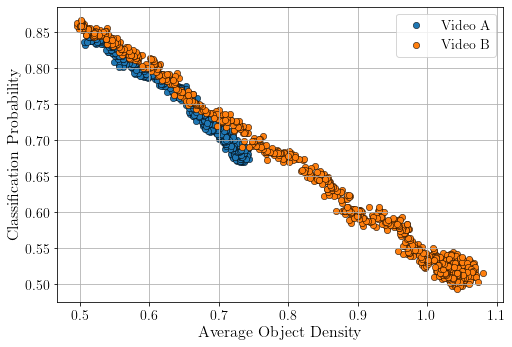

In [ ]:
%run functions.py
plt.scatter(normalize_DRB(z_data_1,5,0.0000001),top_probs_1,s=si,label="Video A",edgecolor = 'k',linewidths=0.5)
plt.scatter(normalize_DRB(z_data_2,5,0.0000001),top_probs_2,s=si,label="Video B",edgecolor = 'k',linewidths=0.5)
plt.ylabel("Classification Probability")
plt.xlabel("Average Object Density (obj/pix^2)")
plt.grid()  
plt.legend()
plt.savefig("cluster_thresholds_with_z4.pdf", format="pdf", bbox_inches="tight")

In [18]:

print(len(top_probs))
print(len(top_probs))

836


# plotting errors at difference Probabilities

In [113]:
videos = r"C:\Users\USER\OneDrive - Stellenbosch University\Masters\Thesis\virtual_envs\coldb_files\four_models\Cascade R-CNN_V3"

# Counting threshold
#threshold = 0.95
scale_dict = {}
scale_error_mean = np.array([])
#threshold = 0.78#np.linspace(1,4,10)
#custome_bw = np.array([200,  200])


# def normalize_DRB(z):
#     tmax = 8
#     tmin = 2
#     z_norm = (tmax-tmin)*(z - min_z)/(max_z-min_z) + tmin
#     return z_norm




def errors_at_probs(): #function used for optimization
    first =True
    # Variable to optimize 
    tmin = 2.14
    tmax = 5.87
    threshold = 0.78
    frame_num = 1
    #threshold = 0.78

    # Dictionary to store results (error, count etc) for each video


    probs  = np.linspace(0.05,0.95,100)
    average_prob_errors_LDPS = []
    average_prob_errors_bl = []
    for prob in probs:
        threshold=prob
        video_dict = {}
        video_errors = []
        video_errors_baseline = []
        video_errors_LDPS = []
        video_errors_skl = []
        ground_truths = []
        base_line_counts = []
        LDPS_counts = []

        # loop through each video
        for video in tqdm(os.listdir(videos)):

            videos_path = os.path.join(videos,video)
            if video not in ["Altitude_videos","Circle_vid","dicts","val",'DJI_0830-522']:

                # define a list for all the counts made in a video - the average of this count is the final video count
                video_counts =[]
                video_counts_stats = []
                video_counts_skl = []

                # Create name for txt
                gt = int(video.split("-")[1])
                # Try to remove space before gt (( eg: DJI_0808 -" "1200))
                try:
                    gt = int(gt.split(" ")[1])

                except: 
                    # Does nothing
                    hold = 1

                # Declare limit vairable for to limit the number of frames used per video     
                limit = 0

                # Get ALL results for the current txt
                for frame in os.listdir(videos_path):

                    # lists for each frame
                    x_data = np.array([])
                    y_data = np.array([])
                    p_data = np.array([])
                    p_scaled = np.array([])

                    # only use X frames in video
                    if limit < frame_num:

                        # Reset the count for each frame
                        count = 0
                        count_stats = 0
                        count_skl = 0

                        p_scaled_stats = np.array([])
                        p_scaled_skl = np.array([])

                        # Join path
                        frame_path = os.path.join(videos_path,frame)

                        results = get_results(frame_path)
                        last = len(results)

                        # generate data for KDE mode
                        for i in range(int(last/5)):
                            # get the first five elements in results
                            five = list(results[0:5])

                            # Calculate centers of BB
                            xt = int(five[0])
                            yt = int(five[1])
                            xb = int(five[2])
                            yb = int(five[3])
                            xcp = int((xb+xt)/2)
                            ycp = int((yb+yt)/2)


                            prob = five[4]

                            if prob < 1:
                                # ignores detections with probabilities less that 0.05 (5%)
                                if prob  > 0.05:
                                    p_data = np.append(p_data,prob)
                                    x_data = np.append(x_data,xcp)
                                    y_data = np.append(y_data,ycp)


                            # removing the first 5 elements - (their data have been captured) 
                            for y in [1,2,3,4,5]:
                                results.pop(0)

                        # Generate KDE model from data
                        # try:
                        #     # Statsmodels 
                        model = KDEMultivariate([x_data, y_data], 'cc', bw=np.array([250,250]))
                        
                        # Sklearn 
                        # values = np.vstack([x_data, y_data])
                        # model_skl = st.gaussian_kde(values, bw_method = 'silverman') 
                        
                        # except:
                        #     print("Not enough data for video " + video)
                            
                        # Generate Z data for each frame
                        z_data = model.pdf([x_data,y_data])
                        # z_data_skl = model_skl.pdf([x_data,y_data])

                        # normalize Z ( ensure that z falls between 0-1 and have the same datum)
                        z_norm = (tmax-tmin)*(z_data - min_z)/(max_z-min_z) + tmin
                        #z_norm = normalize_DRB(z_data)
                        #z_norm_skl = normalize_skl(z_data_skl)
                        
                        # STATS --------------------
                        #Scale P_data - only scale p if z_norm is greater than a specified value
                        for i in range(len(z_norm)):
                            if z_norm[i] >= 0 and gt > 200: 
                                p_scaled_stats = np.append(p_scaled_stats,(p_data[i]*z_norm[i]))
                            else:
                                p_scaled_stats = np.append(p_scaled_stats,p_data[i])

                        #p_scaled = p_data + z_norm*1.05263158
                        # get count for each frame using density information
                        for i in p_scaled_stats:
                            if i >= threshold:
                                count_stats +=1
                        
                        video_counts_stats.append(count_stats)

                        for i in p_scaled_skl:
                            if i >= threshold:
                                count_skl +=1
                        
                        video_counts_skl.append(count_skl)

                        # No density - baseline 
                        for i in p_data:
                            if i >= threshold:
                                count +=1
                        
                        video_counts.append(count)

                        # increment the number of frames limit
                        limit += 1

                # Calculate the average of all frame counts
                video_average = stats.mean(video_counts)
                video_average_stats = stats.mean(video_counts_stats)
                base_line_counts.append(video_average)
                LDPS_counts.append(video_average_stats)

                # Calculate the error for each video
                error = abs(gt - video_average)#/gt
                error_stats = abs(gt - video_average_stats)#/gt

                # Append error of current video to all video errors
                video_errors_baseline.append(error)
                video_errors_LDPS.append(error_stats)
                ground_truths.append(gt)

        average_prob_errors_bl.append(np.mean(video_errors_baseline))
        average_prob_errors_LDPS.append(np.mean(video_errors_LDPS))
    return average_prob_errors_bl,average_prob_errors_LDPS,probs

print("DONE")

bl_errors, LDPS_errors, probs = errors_at_probs()

DONE


100%|██████████| 24/24 [00:05<00:00,  4.60it/s]


0.7772727272727273


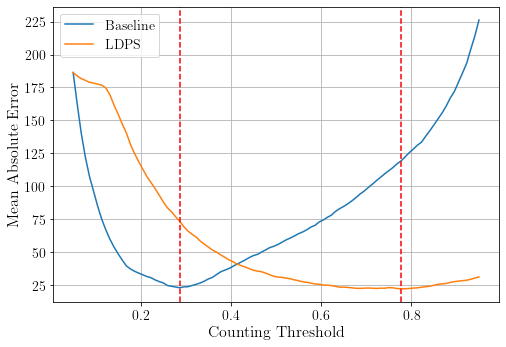

In [118]:




plt.clf()
plt.plot(probs,bl_errors,label='Baseline')
plt.plot(probs,LDPS_errors,label='LDPS')

# Get min value
low = probs[LDPS_errors.index(min(LDPS_errors))]
print(low)
plt.axvline(x=low, color='r', linestyle='--')

lowbl = probs[bl_errors.index(min(bl_errors))]

plt.axvline(x=lowbl, color='r', linestyle='--')
# # Plotting prob of lowest error
# min_error_LDPS = min(LDPS_errors)
# min_prob_LDPS = probs[LDPS_errors.index(min_error_LDPS)]
# plt.scatter(min_prob_LDPS,min_error_LDPS,label="Optimal Prop", marker="o",c = 'g')

# plt.plot(scales,skl_scale_errors,label='skl')
plt.xlabel("Counting Threshold")
plt.ylabel("Mean Absolute Error")
plt.legend()
plt.grid()
plt.savefig("prob_errors_2.pdf", format="pdf", bbox_inches="tight")

In [59]:


plt.clf()
plt.plot(scales,scale_error_mean,label = "scale error")

plt.ylabel("Average Error")
plt.legend()
plt.savefig("scale_error_on_z.pdf", format="pdf", bbox_inches="tight")
plt.clf()


## Get difference between New and Old error

In [13]:
print(len(error_list))
print(len(error_list_new))
difference = []
for i in range(len(error_list)):

    difference.append(error_list[i] - error_list_new[i])

20
20


In [18]:
plt.clf()

plt.scatter(names,difference,label = "Error Difference")
plt.ylabel("Error")
plt.xticks(rotation=90)
plt.legend()
plt.grid()
plt.savefig("error_difference.pdf", format="pdf", bbox_inches="tight")
plt.clf()
print("Average Difference: ",stat.mean(difference))

Average Difference:  -0.006954457618144112


<Figure size 576x391.586 with 0 Axes>

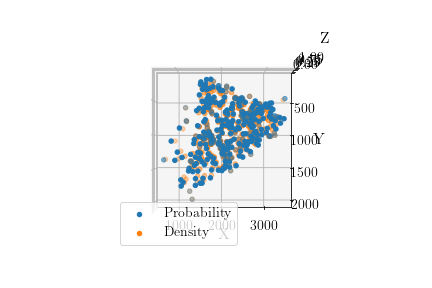

In [55]:
%matplotlib widget
X_tb,Y_tb,Z_tb,P_tb = data_dict['DJI_0808 - 200']
#fig = plt.figure()
max_num = len(X_tb)
ax = plt.axes(projection='3d')


ax.invert_yaxis()
ax.invert_yaxis()
ax.scatter3D(X_tb[:max_num],Y_tb[:max_num],P_tb[:max_num],label="Probability")
ax.scatter3D(X_tb[:max_num],Y_tb[:max_num],normalize(Z_tb[:max_num]),label="Density")
ax.legend()

ax.set_xlabel("X")
ax.set_ylabel("Y")
ax.set_zlabel("Z")



ax.view_init(90,90)

In [113]:
image_path = r"E:\Downloads\frame_5_!200.jpg"
save_path = 'dots_1130.png'
image =  cv2.imread(image_path)
blank_image = np.zeros(shape=image.shape, dtype=np.uint8)
data =[]
xc =[]
yc = []
# x,y    w,h 
#length = len(coords)
for x in range(len(X_tb)):

    cv2.rectangle(blank_image, (X_tb[x],Y_tb[x]), (X_tb[x],Y_tb[x]), (0, 255, 0), 10)
    xc.append(xcp)
    yc.append(ycp)
    data.append([xcp,ycp])






cv2.imwrite(save_path,blank_image)


True

In [23]:
## Bandwidth
model = KDEMultivariate([x_data, y_data], 'cc', bw='normal_reference')
print(model.bw)

[166.4222219  132.45970926]


### 

In [33]:
max(z_data)

2.980763093425297e-07

In [21]:
import cv2

image_path = r"E:\Downloads\frame_0_!1021.jpg"
save_path = 'image.png'
image =  cv2.imread(image_path)
print(image.shape)
shape = image.shape
blank_image = np.zeros(shape=shape, dtype=np.uint8)
data =[]
xc =[]
yc = []
# x,y    w,h 
length = len(co_and_prob)
for x in range(2139):
    
    center = co_and_prob[x][0]
    
    #cv2.rectangle(image, start, end, (0, 255, 0), 3)
    cv2.rectangle(blank_image, center, center, (0, 255, 0), 5)
    xcp = center[0]
    ycp = center[1]

    xc.append(xcp)
    yc.append(ycp)

cv2.imwrite(save_path,blank_image)



(2160, 3840, 3)


True

# Seaborn KDE visualization  

In [22]:
x= np.asarray(xc)
y = np.asarray(yc)

# Kde for x var
# Test which bw_adjust value results in the best performance 
fig.clf() 
ax = sns.kdeplot(x=x,y=y,shade=True,bw_adjust=1.1,cbar=True)
ax.invert_yaxis()
fig = ax.get_figure()
plt.axis('on')
fig.savefig('density.pdf')
fig.clf()

In [23]:
sns.displot

<Axes.ArtistList of 0 lines>

In [24]:
print(ax.get_lines()[0].get_data())

IndexError: list index out of range

In [ ]:
# import statsmodels.api as sm

# dens = sm.nonparametric.KDEUnivariate(np.random.randn(1000))
# dens.fit()
# x =np.linspace(0,1,100) #restrict range to (0,1)
# y = dens.evaluate(x)
# plt.plot(x,y)

In [ ]:
# import numpy as np
# from seaborn import kdeplot

# my_data = np.random.randn(1000)
# my_kde = kdeplot(my_data)
# line = my_kde.lines[2]
# x, y = line.get_data()

# fig, ax = plt.subplots()
# ax.plot(x[x>0], y[x>0])

In [ ]:
# plt.plot(x,y)
# plt.savefig('test.pdf')

# KDE with StatsModels

In [41]:
# for x in range(2139):
    
#     center = co_and_prob[x][0]
    
#     #cv2.rectangle(image, start, end, (0, 255, 0), 3)
#     cv2.rectangle(blank_image, center, center, (0, 255, 0), 5)
#     xcp = center[0]
#     ycp = center[1]

#     xc.append(xcp)
#     yc.append(ycp)

# x= np.asarray(xc)
# y = np.asarray(yc)



In [47]:
# Triangulation with refinement
triang = tri.Triangulation(X[:1500], Y[:1500])
refiner = tri.UniformTriRefiner(triang)
tri_refi, z_refi = refiner.refine_field(zi, subdiv=5)  # three levels of subdivisions

ValueError: z array must have same length as triangulation x and y arrays

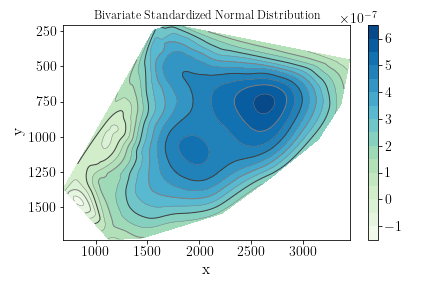

In [46]:
# Graphical visualization
plt.clf()
fig, ax = plt.subplots()
ax.invert_yaxis()
ax.set_title('Bivariate Standardized Normal Distribution')
ax.triplot(triang, color='white', lw=0.5)
cax = ax.tricontourf(tri_refi, z_refi, 16, cmap=plt.cm.GnBu)
ax.tricontour(tri_refi, z_refi, 16, colors=['0.25', '0.5', '0.5', '0.5'], 
              linewidths=[1.0, 0.5, 1.0, 0.5])
cbar = fig.colorbar(cax)
ax.set_xlabel('x')
ax.set_ylabel('y')
plt.tight_layout()
plt.savefig("statsmodels_kde.pdf", format="pdf", bbox_inches="tight")


(1000,)
(1000,)
(1000,)


In [ ]:
plt.clf
plt.box(top_probs_KDE)

plt.savefig("z.pdf", format="pdf", bbox_inches="tight")

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


In [151]:
len(co_and_prob)

7101

In [263]:
zz =[]
co_and_prob=co_and_prob[:1200]
for i in co_and_prob:

    centre = i[0]
    prob = i[1]
    z = model.pdf(centre)
    zz.append(z)

plt.clf()
plt.boxplot(zz)
plt.title("--- Z ---")
plt.savefig("zzz.pdf", format="pdf", bbox_inches="tight")
plt.clf()

In [247]:
print(co_and_prob[1010])
print(zz[150])

[[1353, 285], 0.4398839473724365]
1.744664232067519


# Model probs at different instance densities using KDE

In [260]:
# def adjust_z(z):
#     # multiply by 1000 
#     # Minimum value should be one i.e. no change to the threshold (threshold*1 = threshold)
#     z_adj = -z*1000000  + 1
#     return z_adj

def KDE(results):
    co_and_prob = []
    x_data = []
    y_data = []
    z_data = []
    new_prob_list =[]
    
# Creating co_prob list
    last = len(results)
    for i in range(int(last/5)):
        five = list(results[0:5])
        # Calculate centers of BB
        xt = int(five[0])
        yt = int(five[1])
        xb = int(five[2])
        yb = int(five[3])
        start = (xt, yt)
        end = (xb,yb)
        xcp = int((xb+xt)/2)
        ycp = int((yb+yt)/2)
        x_data.append(xcp)
        y_data.append(ycp)
        center = [xcp,ycp]
        prob = five[4]
        z_data.append(prob)
        # Create 
        coord_prob = [center,prob]
        co_and_prob.append(coord_prob)
        # removing the 5 elements appended to co_and_prob 
        for y in [1,2,3,4,5]:
            results.pop(0)

# Creating KDE model
    x= np.asarray(x_data)
    y = np.asarray(y_data)
    # Kernel density estimation (statsmodels)
    model = KDEMultivariate([x, y], 'cc', bw='normal_reference')  
    # cross validation maximum likelihood bandwidth selection     


# Calculate new probs using model
    for entry in co_and_prob:

        center = entry[0]
        prob = float(entry[1])

      
        z = model.pdf(center)
        z_adj = -z* 1000000 + 1

        new_prob = prob / z_adj
        new_prob_list.append(new_prob)


    return new_prob_list


   

In [261]:
plt.clf()
vid_dir = r"C:\Users\USER\OneDrive - Stellenbosch University\Masters\Thesis\virtual_envs\coldb_files\four_models\Cascade R-CNN_V3\Circle_vid"



from tqdm import tqdm
for vid in os.listdir(vid_dir):
    if vid != "DJI_0846_circle-1003":
        #for x in tqdm(my_list):
            # do something with x
            
        GT = vid.split("-")[1]
        frame_dir = os.path.join(vid_dir,vid)    
        frame_dir_list =  os.listdir(frame_dir)   
        top_probs =[]
        top_probs_KDE = []

        # for i in tqdm(range(len(frame_dir_list))):
        for i in tqdm(range(0,800,50)):
            frame = 'frame_'+str(i)+'_!' + GT+'.txt'
            txt_path = os.path.join(frame_dir,frame)
            
            
            try:
                results = get_results(txt_path)
            except:
                print("Invalid argument")
                print(txt_path)
            #Get probs
            probs = get_probs(results) # list of all probs in one txt. 
            probs = probs[:int(GT)]
            average_of_probs = stat.mean(probs)
            top_probs.append(average_of_probs)
            #print(probs)

            # KDE
            KDE_top_probs = KDE(results)
            KDE_top_probs = KDE_top_probs[:int(GT)]
            average_of_KDE_probs = stat.mean(KDE_top_probs)
            top_probs_KDE.append(average_of_KDE_probs)
            

            
        if vid == "DJI_0851_circle-1021":    
            plt.plot(top_probs,label="Video A - dflt")
            plt.plot(top_probs_KDE,label="Video A - KDE")
        else:
            plt.plot(top_probs,label="Video B - dflt")
            plt.plot(top_probs_KDE,label="Video B - KDE")
        plt.xlabel("Video Frames")

        plt.ylabel("Average Model Probability")
plt.grid()  
plt.legend()
plt.savefig("cluster_thresholds.pdf", format="pdf", bbox_inches="tight")

100%|██████████| 16/16 [00:05<00:00,  2.71it/s]


In [44]:

plt.clf()
plt.boxplot(normalize(z_data))
plt.title("Top Probs ")
plt.savefig("top_probs.pdf", format="pdf", bbox_inches="tight")
plt.clf()

In [235]:
len(top_probs_KDE)

16

In [262]:
top_probs_KDE

[1.0002150427273082,
 0.948644913957469,
 0.9646230307659611,
 0.9140662057124954,
 0.9363638210561106,
 0.9281028025564936,
 0.9062727641589985,
 0.9272940640121943,
 0.9185269407611888,
 0.951836412828423,
 0.9724764959711807,
 0.99200907938254,
 1.023077385642968,
 1.0378435366894918,
 1.0699484047763912,
 1.070613710393381]

In [83]:

zi = KDEMultivariate([x_data, y_data], 'cc', bw=np.array([2000,2000])) 
# Triangulation with refinement
triang = tri.Triangulation(x_data, y_data)
refiner = tri.UniformTriRefiner(triang)
tri_refi, z_refi = refiner.refine_field(zi, subdiv=5)  # three levels of subdivisions

# Graphical visualization
plt.clf()
fig, ax = plt.subplots()
ax.invert_yaxis()
ax.set_title('Bivariate Standardized Normal Distribution')
ax.triplot(triang, color='white', lw=0.5)
cax = ax.tricontourf(tri_refi, z_refi, 16, cmap=plt.cm.GnBu)
ax.tricontour(tri_refi, z_refi, 16, colors=['0.25', '0.5', '0.5', '0.5'], 
              linewidths=[1.0, 0.5, 1.0, 0.5])
cbar = fig.colorbar(cax)
ax.set_xlabel('x')
ax.set_ylabel('y')
plt.tight_layout()
plt.savefig("statsmodels_kde.pdf", format="pdf", bbox_inches="tight")

ValueError: z array must have same length as triangulation x and y arrays

In [35]:
x_data
dfx =  pd.DataFrame(x_data)
dfy =  pd.DataFrame(y_data)

<AxesSubplot:ylabel='Density'>

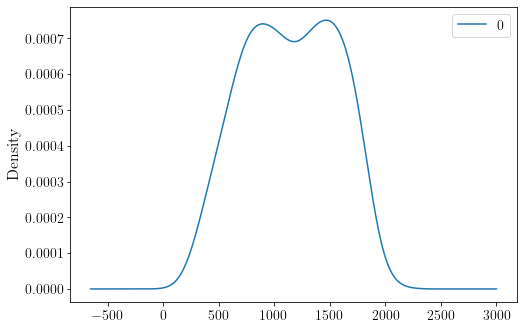

In [36]:
dfy.plot.kde(bw_method=0.3)

# KDE with scipy

In [51]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as st
from sklearn.datasets import make_blobs

-91.6 1475.6 79.0 1123.0


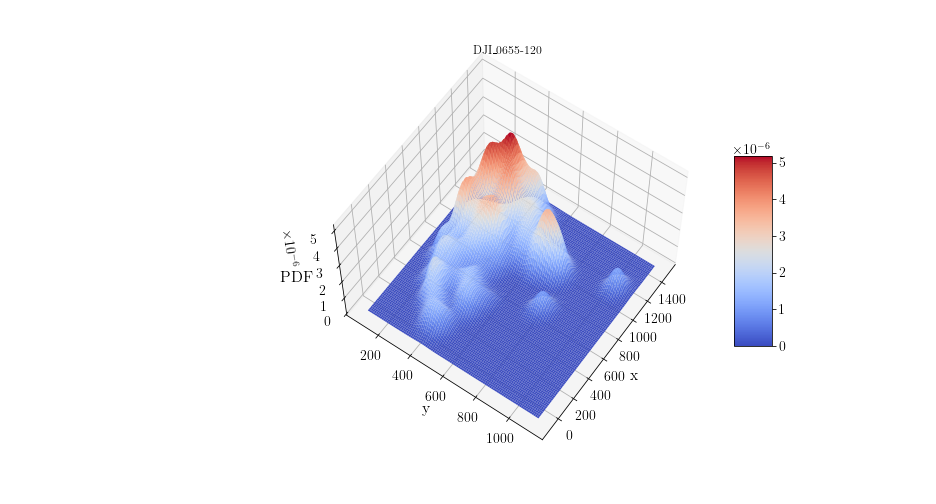

In [72]:
x,y,z,p = data_dict['DJI_0655-120']
# Extract x and y

# Define the borders
deltaX = (max(x) - min(x))/10
deltaY = (max(y) - min(y))/10
xmin = min(x) - deltaX
xmax = max(x) + deltaX
ymin = min(y) - deltaY
ymax = max(y) + deltaY
print(xmin, xmax, ymin, ymax)
# Create meshgrid
xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]

positions = np.vstack([xx.ravel(), yy.ravel()])
values = np.vstack([x, y])
kernel = st.gaussian_kde(values, bw_method=0.2)
f = np.reshape(kernel(positions).T, xx.shape)

%matplotlib widget
fig = plt.figure(figsize=(13, 7))
ax = plt.axes(projection='3d')
ax.invert_yaxis()
surf = ax.plot_surface(xx, yy, f, rstride=1, cstride=1, cmap='coolwarm', edgecolor='none')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('PDF')
ax.set_title('DJI_0655-120')
fig.colorbar(surf, shrink=0.5, aspect=5) # add color bar indicating the PDF
ax.view_init(60, 35)

-32.599999999999994 1846.6 -44.400000000000006 1160.4


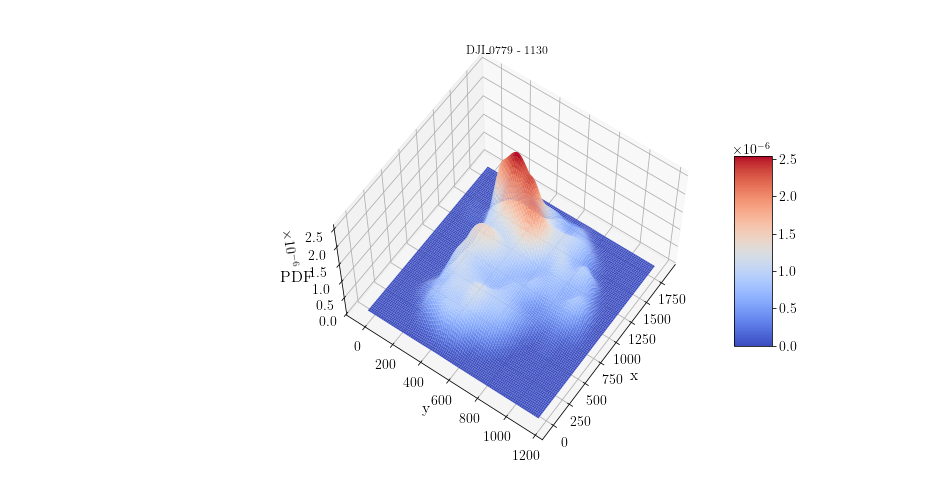

In [90]:
x,y,z,p = data_dict['DJI_0779 - 1130']
# Extract x and y

# Define the borders
deltaX = (max(x) - min(x))/10
deltaY = (max(y) - min(y))/10
xmin = min(x) - deltaX
xmax = max(x) + deltaX
ymin = min(y) - deltaY
ymax = max(y) + deltaY
print(xmin, xmax, ymin, ymax)
# Create meshgrid
xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]

positions = np.vstack([xx.ravel(), yy.ravel()])
values = np.vstack([x, y])
kernel = st.gaussian_kde(values, bw_method=0.18)
f = np.reshape(kernel(positions).T, xx.shape)

%matplotlib widget
fig = plt.figure(figsize=(13, 7))
ax = plt.axes(projection='3d')
ax.invert_yaxis()
surf = ax.plot_surface(xx, yy, f, rstride=1, cstride=1, cmap='coolwarm', edgecolor='none')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('PDF')
ax.set_title('DJI_0779 - 1130')
fig.colorbar(surf, shrink=0.5, aspect=5) # add color bar indicating the PDF
ax.view_init(60, 35)

411.7 3727.3 -6.699999999999989 2161.7


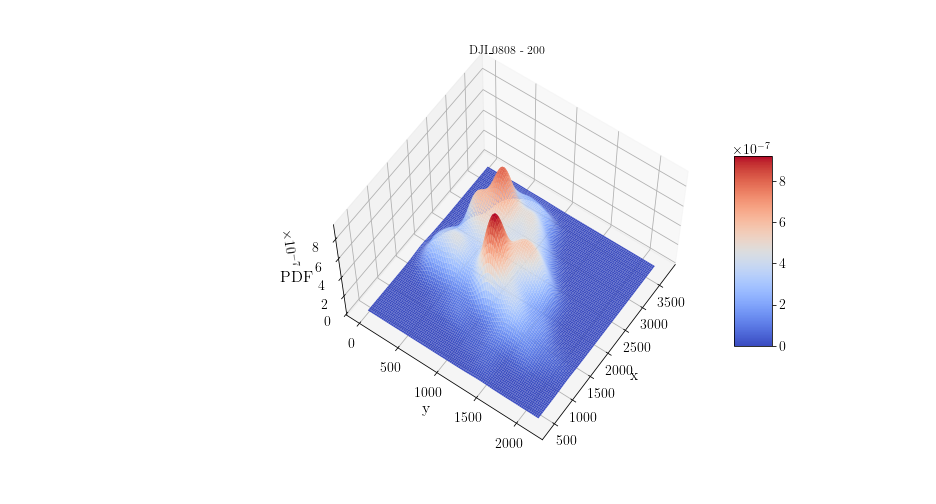

In [81]:
x,y,z,p = data_dict['DJI_0808 - 200']
# Extract x and y

# Define the borders
deltaX = (max(x) - min(x))/10
deltaY = (max(y) - min(y))/10
xmin = min(x) - deltaX
xmax = max(x) + deltaX
ymin = min(y) - deltaY
ymax = max(y) + deltaY
print(xmin, xmax, ymin, ymax)
# Create meshgrid
xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]

positions = np.vstack([xx.ravel(), yy.ravel()])
values = np.vstack([x, y])
model = st.gaussian_kde(values, bw_method=0.3)
f = np.reshape(model(positions).T, xx.shape)

%matplotlib widget
fig = plt.figure(figsize=(13, 7))
ax = plt.axes(projection='3d')
ax.invert_yaxis()
surf = ax.plot_surface(xx, yy, f, rstride=1, cstride=1, cmap='coolwarm', edgecolor='none')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('PDF')
ax.set_title('DJI_0808 - 200')
fig.colorbar(surf, shrink=0.5, aspect=5) # add color bar indicating the PDF
ax.view_init(60, 35)

In [78]:
print(f)
f.shape
kernel

[[6.06522441e-24 1.98427972e-23 6.56817886e-23 ... 1.28427672e-13
  8.10371529e-14 5.10092238e-14]
 [3.31810487e-23 1.03752066e-22 3.25581402e-22 ... 2.85616304e-13
  1.82950035e-13 1.17632464e-13]
 [1.75808042e-22 5.28360202e-22 1.57975245e-21 ... 6.18408856e-13
  4.03836077e-13 2.66096251e-13]
 ...
 [2.00419751e-12 4.87133996e-12 1.12896371e-11 ... 1.16517353e-38
  1.22372837e-39 1.22696811e-40]
 [1.98819654e-12 4.76146493e-12 1.08728186e-11 ... 1.67661217e-39
  1.73039180e-40 1.70618763e-41]
 [1.88306445e-12 4.44350062e-12 9.99778203e-12 ... 2.31641103e-40
  2.34500125e-41 2.27103007e-42]]


In [83]:
kernel.pdf([1500,1000])

array([5.35628259e-07])

In [10]:

videos = r'C:\Users\USER\OneDrive - Stellenbosch University\Masters\Thesis\virtual_envs\coldb_files\four_models\Cascade R-CNN_V3'

def test_func(): #function used for optimization
    
    # Variable to optimize 
    tmin = 2.14
    tmax = 5.87
    threshold = 0.78
    frame_num = 1
    #threshold = 0.78

    bw_vals = np.linspace(10,500,2)

    bw_errors_bl = []
    bw_errors_LDPS = []
    
    for xx in bw_vals:

        print("bw: ",xx)
        # loop through each video
            # Dictionary to store results (error, count etc) for each video
        video_dict = {}
        video_errors = []
        video_errors_baseline =[]
        video_errors_LDPS = []
        video_errors_skl = []
        ground_truths = []
        base_line_counts = []
        LDPS_counts = []

        first =True
        for video in tqdm(os.listdir(videos)):

            videos_path = os.path.join(videos,video)
            if video == 'DJI_0839-853':# not in ["Altitude_videos","Circle_vid","dicts","val",'DJI_0830-522']:

                # define a list for all the counts made in a video - the average of this count is the final video count
                video_counts =[]
                video_counts_stats = []
                video_counts_skl = []

                # Create name for txt
                gt = int(video.split("-")[1])
                # Try to remove space before gt (( eg: DJI_0808 -" "1200))
                try:
                    gt = int(gt.split(" ")[1])

                except: 
                    # Does nothing
                    hold = 1

                # Declare limit vairable for to limit the number of frames used per video     
                limit = 0

                # Get ALL results for the current txt
                for frame in os.listdir(videos_path):

                    # lists for each frame
                    x_data = np.array([])
                    y_data = np.array([])
                    p_data = np.array([])
                    p_scaled = np.array([])

                    # only use X frames in video
                    if limit < frame_num:

                        # Reset the count for each frame
                        count = 0
                        count_stats = 0
                        count_skl = 0

                        p_scaled_stats = np.array([])
                        p_scaled_skl = np.array([])

                        # Join path
                        frame_path = os.path.join(videos_path,frame)

                        results = get_results(frame_path)
                        last = len(results)

                        # generate data for KDE mode
                        for i in range(int(last/5)):
                            # get the first five elements in results
                            five = list(results[0:5])

                            # Calculate centers of BB
                            xt = int(five[0])
                            yt = int(five[1])
                            xb = int(five[2])
                            yb = int(five[3])
                            xcp = int((xb+xt)/2)
                            ycp = int((yb+yt)/2)


                            prob = five[4]

                            if prob < 1:
                                # ignores detections with probabilities less that 0.05 (5%)
                                if prob  > 0.05:
                                    p_data = np.append(p_data,prob)
                                    x_data = np.append(x_data,xcp)
                                    y_data = np.append(y_data,ycp)


                            # removing the first 5 elements - (their data have been captured) 
                            for y in [1,2,3,4,5]:
                                results.pop(0)

                        # Generate KDE model from data
                        # try:
                        #     # Statsmodels 
                        model = KDEMultivariate([x_data, y_data], 'cc', bw=np.array([xx,xx]))
                        
                        # Sklearn 
                        # values = np.vstack([x_data, y_data])
                        # model_skl = st.gaussian_kde(values, bw_method = 'silverman') 
                        
                        # except:
                        #     print("Not enough data for video " + video)
                            
                        # Generate Z data for each frame
                        z_data = model.pdf([x_data,y_data])
                        # z_data_skl = model_skl.pdf([x_data,y_data])

                        # normalize Z ( ensure that z falls between 0-1 and have the same datum)
                        z_norm = (tmax-tmin)*(z_data - min_z)/(max_z-min_z) + tmin
                        #z_norm = normalize_DRB(z_data)
                        #z_norm_skl = normalize_skl(z_data_skl)
                        
                        # STATS --------------------
                        #Scale P_data - only scale p if z_norm is greater than a specified value
                        for i in range(len(z_norm)):
                            if z_norm[i] >= 0 and gt > 200: 
                                p_scaled_stats = np.append(p_scaled_stats,(p_data[i]*z_norm[i]))
                            else:
                                p_scaled_stats = np.append(p_scaled_stats,p_data[i])

                        #p_scaled = p_data + z_norm*1.05263158
                        # get count for each frame using density information
                        for i in p_scaled_stats:
                            if i >= threshold:
                                count_stats +=1
                        
                        video_counts_stats.append(count_stats)

                        for i in p_scaled_skl:
                            if i >= threshold:
                                count_skl +=1
                        
                        video_counts_skl.append(count_skl)

                        # No density - baseline 
                        for i in p_data:
                            if i >= threshold:
                                count +=1
                        
                        video_counts.append(count)

                        # increment the number of frames limit
                        limit += 1

                # Calculate the average of all frame counts
                video_average = stats.mean(video_counts)
                video_average_stats = stats.mean(video_counts_stats)
                base_line_counts.append(video_average)
                LDPS_counts.append(video_average_stats)

                # Calculate the error for each video
                error = abs(gt - video_average)#/gt
                error_stats = abs(gt - video_average_stats)#/gt

                # Append error of current video to all video errors
                video_errors_baseline.append(error)
                video_errors_LDPS.append(error_stats)
                ground_truths.append(gt)

        bw_errors_bl.append(np.mean(video_errors_baseline))
        bw_errors_LDPS.append(np.mean(video_errors_LDPS))

    return bw_errors_bl,bw_errors_LDPS

print("DONE")

DONE


In [5]:
print("C")

bl,ldps= test_func()

C
bw:  10.0


100%|██████████| 24/24 [00:00<?, ?it/s]
c:\Users\USER\OneDrive - Stellenbosch University\Masters\Thesis\virtual_envs\DRB_venv\lib\site-packages\numpy\core\fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\Users\USER\OneDrive - Stellenbosch University\Masters\Thesis\virtual_envs\DRB_venv\lib\site-packages\numpy\core\_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


bw:  500.0


100%|██████████| 24/24 [00:00<?, ?it/s]


In [35]:

print("Baseline:     ",baseline)
print("LDPS:         ",LDPS)
print("Ground Truth: ",gt)

Baseline:      720
LDPS:          842
Ground Truth:  853


# Finding bw value and plotting

In [24]:
videos = r'C:\Users\USER\OneDrive - Stellenbosch University\Masters\Thesis\virtual_envs\coldb_files\four_models\Cascade R-CNN_V3'

def find_bw(): #function used for optimization
    first =True
    # Variable to optimize 
    tmin = 2.14
    tmax = 5.87
    threshold = 0.78
    frame_num = 1
    #threshold = 0.78

    # Dictionary to store results (error, count etc) for each video
    bws = np.linspace(100,1000,100)
    baseline_bw_error = []
    ldps_bw_error = []

   
    average_bw_errors_LDPS = []
    average_bw_errors_bl = []
    for bw in bws:
        
        video_dict = {}
        video_errors = []
        video_errors_baseline =[]
        video_errors_LDPS = []
        video_errors_skl = []
        ground_truths = []
        base_line_counts = []
        LDPS_counts = []

        # loop through each video
        for video in tqdm(os.listdir(videos)):

            videos_path = os.path.join(videos,video)
            if video not in ["Altitude_videos","Circle_vid","dicts","val",'DJI_0830-522']:

                # define a list for all the counts made in a video - the average of this count is the final video count
                video_counts =[]
                video_counts_stats = []
                video_counts_skl = []

                # Create name for txt
                gt = int(video.split("-")[1])
                # Try to remove space before gt (( eg: DJI_0808 -" "1200))
                try:
                    gt = int(gt.split(" ")[1])

                except: 
                    # Does nothing
                    hold = 1

                # Declare limit vairable for to limit the number of frames used per video     
                limit = 0

                # Get ALL results for the current txt
                for frame in os.listdir(videos_path):

                    # lists for each frame
                    x_data = np.array([])
                    y_data = np.array([])
                    p_data = np.array([])
                    p_scaled = np.array([])

                    # only use X frames in video
                    if limit < frame_num:

                        # Reset the count for each frame
                        count = 0
                        count_stats = 0
                        count_skl = 0

                        p_scaled_stats = np.array([])
                        p_scaled_skl = np.array([])

                        # Join path
                        frame_path = os.path.join(videos_path,frame)

                        results = get_results(frame_path)
                        last = len(results)

                        # generate data for KDE mode
                        for i in range(int(last/5)):
                            # get the first five elements in results
                            five = list(results[0:5])

                            # Calculate centers of BB
                            xt = int(five[0])
                            yt = int(five[1])
                            xb = int(five[2])
                            yb = int(five[3])
                            xcp = int((xb+xt)/2)
                            ycp = int((yb+yt)/2)


                            prob = five[4]

                            if prob < 1:
                                # ignores detections with probabilities less that 0.05 (5%)
                                if prob  > 0.05:
                                    p_data = np.append(p_data,prob)
                                    x_data = np.append(x_data,xcp)
                                    y_data = np.append(y_data,ycp)


                            # removing the first 5 elements - (their data have been captured) 
                            for y in [1,2,3,4,5]:
                                results.pop(0)

                        # Generate KDE model from data
                        # try:
                        #     # Statsmodels 
                        model = KDEMultivariate([x_data, y_data], 'cc', bw=np.array([bw,bw]))
                        
                        # Sklearn 
                        # values = np.vstack([x_data, y_data])
                        # model_skl = st.gaussian_kde(values, bw_method = 'silverman') 
                        
                        # except:
                        #     print("Not enough data for video " + video)
                            
                        # Generate Z data for each frame
                        z_data = model.pdf([x_data,y_data])
                        # z_data_skl = model_skl.pdf([x_data,y_data])

                        # normalize Z ( ensure that z falls between 0-1 and have the same datum)
                        z_norm = (tmax-tmin)*(z_data - min_z)/(max_z-min_z) + tmin
                        #z_norm = normalize_DRB(z_data)
                        #z_norm_skl = normalize_skl(z_data_skl)
                        
                        # STATS --------------------
                        #Scale P_data - only scale p if z_norm is greater than a specified value
                        for i in range(len(z_norm)):
                            if z_norm[i] >= 0 and gt > 200: 
                                p_scaled_stats = np.append(p_scaled_stats,(p_data[i]*z_norm[i]))
                            else:
                                p_scaled_stats = np.append(p_scaled_stats,p_data[i])

                        #p_scaled = p_data + z_norm*1.05263158
                        # get count for each frame using density information
                        for i in p_scaled_stats:
                            if i >= threshold:
                                count_stats +=1
                        
                        video_counts_stats.append(count_stats)

                        for i in p_scaled_skl:
                            if i >= threshold:
                                count_skl +=1
                        
                        video_counts_skl.append(count_skl)

                        # No density - baseline 
                        for i in p_data:
                            if i >= threshold:
                                count +=1
                        
                        video_counts.append(count)

                        # increment the number of frames limit
                        limit += 1

                # Calculate the average of all frame counts
                video_average = stats.mean(video_counts)
                video_average_stats = stats.mean(video_counts_stats)
                base_line_counts.append(video_average)
                LDPS_counts.append(video_average_stats)

                # Calculate the error for each video
                error = abs(gt - video_average)#/gt
                error_stats = abs(gt - video_average_stats)#/gt

                # Append error of current video to all video errors
                video_errors_baseline.append(error)
                video_errors_LDPS.append(error_stats)
                ground_truths.append(gt)

        average_bw_errors_bl.append(np.mean(video_errors_baseline))
        average_bw_errors_LDPS.append(np.mean(video_errors_LDPS))

        
    return average_bw_errors_bl,average_bw_errors_LDPS,bws

print("DONE")

DONE


In [25]:
bl_bw, ldps_bw, bw = find_bw()

100%|██████████| 24/24 [00:04<00:00,  5.35it/s]


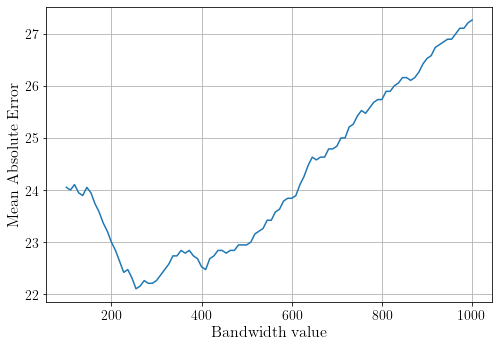

In [26]:
plt.clf()
#
plt.plot(bw,ldps_bw,label='LDPS')

# # Plotting prob of lowest error
# min_error_LDPS = min(LDPS_errors)
# min_prob_LDPS = probs[LDPS_errors.index(min_error_LDPS)]
# plt.scatter(min_prob_LDPS,min_error_LDPS,label="Optimal Prop", marker="o",c = 'g')

# plt.plot(scales,skl_scale_errors,label='skl')
plt.xlabel("Bandwidth value")
plt.ylabel("Mean Absolute Error")
#plt.legend()
plt.grid()
plt.savefig("bw_errors.pdf", format="pdf", bbox_inches="tight")

In [32]:
def get_min(min_index,min_value):
    
    min_pos = min_index.index(min(min_index)) 
    min_value = min_value[min_pos]
    return min_value

In [37]:
get_min(ldps_bw,bw.tolist())

790.909090909091

# Getting BOX plots

In [ ]:
video_dir = r'C:\Users\USER\OneDrive - Stellenbosch University\Masters\Thesis\virtual_envs\coldb_files\four_models\Cascade R-CNN_V3\val'
frame_error = []
order_list = [100,200,300,400,500,600]
order_dict = {}
for order in order_list:
    print(str(order) + "...")

    # theta = np.polyfit(count_c,thresh_c , order)
    # p = np.poly1d(theta)
    #opt_thresh = p(count)
    all_vid_errors = []
    error_dict = {}
    for video in tqdm(os.listdir(videos)):

        videos_path = os.path.join(videos,video)
        if video not in ["Altitude_videos","Circle_vid","dicts","val",'DJI_0830-522']:

            # define a list for all the counts made in a video - the average of this count is the final video count
            video_counts =[]
            video_counts_stats = []
            video_counts_skl = []

            # Create name for txt
            gt = int(video.split("-")[1])
            # Try to remove space before gt (( eg: DJI_0808 -" "1200))
            try:
                gt = int(gt.split(" ")[1])

            except: 
                # Does nothing
                hold = 1

            # Declare limit vairable for to limit the number of frames used per video     
            limit = 0

            # Get ALL results for the current txt
            for frame in os.listdir(videos_path):

                # lists for each frame
                x_data = np.array([])
                y_data = np.array([])
                p_data = np.array([])
                p_scaled = np.array([])

                # only use X frames in video
                if limit < frame_num:

                    # Reset the count for each frame
                    count = 0
                    count_stats = 0
                    count_skl = 0

                    p_scaled_stats = np.array([])
                    p_scaled_skl = np.array([])

                    # Join path
                    frame_path = os.path.join(videos_path,frame)

                    results = get_results(frame_path)
                    last = len(results)

                    # generate data for KDE mode
                    for i in range(int(last/5)):
                        # get the first five elements in results
                        five = list(results[0:5])

                        # Calculate centers of BB
                        xt = int(five[0])
                        yt = int(five[1])
                        xb = int(five[2])
                        yb = int(five[3])
                        xcp = int((xb+xt)/2)
                        ycp = int((yb+yt)/2)


                        prob = five[4]

                        if prob < 1:
                            # ignores detections with probabilities less that 0.05 (5%)
                            if prob  > 0.05:
                                p_data = np.append(p_data,prob)
                                x_data = np.append(x_data,xcp)
                                y_data = np.append(y_data,ycp)


                        # removing the first 5 elements - (their data have been captured) 
                        for y in [1,2,3,4,5]:
                            results.pop(0)

                    # Generate KDE model from data
                    # try:
                    #     # Statsmodels 
                    model = KDEMultivariate([x_data, y_data], 'cc', bw=np.array([x[0],x[1]]))
                    
                    # Sklearn 
                    # values = np.vstack([x_data, y_data])
                    # model_skl = st.gaussian_kde(values, bw_method = 'silverman') 
                    
                    # except:
                    #     print("Not enough data for video " + video)
                        
                    # Generate Z data for each frame
                    z_data = model.pdf([x_data,y_data])
                    # z_data_skl = model_skl.pdf([x_data,y_data])

                    # normalize Z ( ensure that z falls between 0-1 and have the same datum)
                    z_norm = (tmax-tmin)*(z_data - min_z)/(max_z-min_z) + tmin
                    #z_norm = normalize_DRB(z_data)
                    #z_norm_skl = normalize_skl(z_data_skl)
                    
                    # STATS --------------------
                    #Scale P_data - only scale p if z_norm is greater than a specified value
                    for i in range(len(z_norm)):
                        if z_norm[i] >= 0 and gt > 200: 
                            p_scaled_stats = np.append(p_scaled_stats,(p_data[i]*z_norm[i]))
                        else:
                            p_scaled_stats = np.append(p_scaled_stats,p_data[i])

                    #p_scaled = p_data + z_norm*1.05263158
                    # get count for each frame using density information
                    for i in p_scaled_stats:
                        if i >= threshold:
                            count_stats +=1
                    
                    video_counts_stats.append(count_stats)

                    for i in p_scaled_skl:
                        if i >= threshold:
                            count_skl +=1
                    
                    video_counts_skl.append(count_skl)

                    # No density - baseline 
                    for i in p_data:
                        if i >= bl_threshold:
                            count +=1
                    
                    video_counts.append(count)

                    # increment the number of frames limit
                    limit += 1
                    
            
            # Calculate the average of all frame counts
            video_average = stats.mean(video_counts)
            video_average_stats = stats.mean(video_counts_stats)
            base_line_counts.append(video_average)
            LDPS_counts.append(video_average_stats)

            # Calculate the error for each video
            error = abs(gt - video_average)*100/gt
            error_stats = abs(gt - video_average_stats)*100/gt

            # Append error of current video to all video errors
            video_errors_baseline.append(error)
            video_errors_LDPS.append(error_stats)
            ground_truths.append(gt)
            densities.append(np.mean(z_norm))


    return video_errors_baseline, video_errors_LDPS,  ground_truths, frame_num, densities #Variable to minimize

    order_dict[order] =   error_dict  
    #print(len(all_vid_errors))
    av_vid_error = stat.mean(all_vid_errors)
    frame_error.append(av_vid_error)

In [38]:
videos = r"C:\Users\USER\OneDrive - Stellenbosch University\Masters\Thesis\virtual_envs\coldb_files\four_models\Cascade R-CNN_V3"

# Counting threshold
#threshold = 0.95
scale_dict = {}
scale_error_mean = np.array([])
#threshold = 0.78#np.linspace(1,4,10)
#custome_bw = np.array([200,  200])


# def normalize_DRB(z):
#     tmax = 8
#     tmin = 2
#     z_norm = (tmax-tmin)*(z - min_z)/(max_z-min_z) + tmin
#     return z_norm




def objective(x): #function used for optimization
    first =True
    # Variable to optimize 
    tmin = 2.14
    tmax = 5.87
    threshold = 0.78
    bl_threshold = 0.78
    frame_num=1
    #threshold = 0.78

  
    frame_numbers =   [100,200,300,400,500,600]
    error_box =[]
    order_dict ={}
    for num in frame_numbers:
        # loop through each video

          # Dictionary to store results (error, count etc) for each video

        video_errors_LDPS = []
        error_dict = {}
        for video in tqdm(os.listdir(videos)):

            videos_path = os.path.join(videos,video)
            if video not in ["Altitude_videos","Circle_vid","dicts","val",'DJI_0830-522']:

                # define a list for all the counts made in a video - the average of this count is the final video count
                video_counts =[]
                video_counts_stats = []
                video_counts_skl = []

                # Create name for txt
                gt = int(video.split("-")[1])
                # Try to remove space before gt (( eg: DJI_0808 -" "1200))
                try:
                    gt = int(gt.split(" ")[1])

                except: 
                    # Does nothing
                    hold = 1

                # Declare limit vairable for to limit the number of frames used per video     
                limit = 0

                # Get ALL results for the current txt
                for frame in os.listdir(videos_path):

                    # lists for each frame
                    x_data = np.array([])
                    y_data = np.array([])
                    p_data = np.array([])
                    p_scaled = np.array([])

                    # only use X frames in video
                    if limit < num:

                        # Reset the count for each frame
                        count = 0
                        count_stats = 0
                        count_skl = 0

                        p_scaled_stats = np.array([])
                        p_scaled_skl = np.array([])

                        # Join path
                        frame_path = os.path.join(videos_path,frame)

                        results = get_results(frame_path)
                        last = len(results)

                        # generate data for KDE mode
                        for i in range(int(last/5)):
                            # get the first five elements in results
                            five = list(results[0:5])

                            # Calculate centers of BB
                            xt = int(five[0])
                            yt = int(five[1])
                            xb = int(five[2])
                            yb = int(five[3])
                            xcp = int((xb+xt)/2)
                            ycp = int((yb+yt)/2)


                            prob = five[4]

                            if prob < 1:
                                # ignores detections with probabilities less that 0.05 (5%)
                                if prob  > 0.05:
                                    p_data = np.append(p_data,prob)
                                    x_data = np.append(x_data,xcp)
                                    y_data = np.append(y_data,ycp)


                            # removing the first 5 elements - (their data have been captured) 
                            for y in [1,2,3,4,5]:
                                results.pop(0)

                        # Generate KDE model from data
                        # try:
                        #     # Statsmodels 
                        model = KDEMultivariate([x_data, y_data], 'cc', bw=np.array([x[0],x[1]]))
                        
                        # Sklearn 
                        # values = np.vstack([x_data, y_data])
                        # model_skl = st.gaussian_kde(values, bw_method = 'silverman') 
                        
                        # except:
                        #     print("Not enough data for video " + video)
                            
                        # Generate Z data for each frame
                        z_data = model.pdf([x_data,y_data])
                        # z_data_skl = model_skl.pdf([x_data,y_data])

                        # normalize Z ( ensure that z falls between 0-1 and have the same datum)
                        z_norm = (tmax-tmin)*(z_data - min_z)/(max_z-min_z) + tmin
                        #z_norm = normalize_DRB(z_data)
                        #z_norm_skl = normalize_skl(z_data_skl)
                        
                        # STATS --------------------
                        #Scale P_data - only scale p if z_norm is greater than a specified value
                        for i in range(len(z_norm)):
                            if z_norm[i] >= 0 and gt > 200: 
                                p_scaled_stats = np.append(p_scaled_stats,(p_data[i]*z_norm[i]))
                            else:
                                p_scaled_stats = np.append(p_scaled_stats,p_data[i])

                        #p_scaled = p_data + z_norm*1.05263158
                        # get count for each frame using density information
                        for i in p_scaled_stats:
                            if i >= threshold:
                                count_stats +=1
                        
                        video_counts_stats.append(count_stats)

                        for i in p_scaled_skl:
                            if i >= threshold:
                                count_skl +=1
                        
                        video_counts_skl.append(count_skl)

                        # No density - baseline 
                        for i in p_data:
                            if i >= bl_threshold:
                                count +=1
                        
                        video_counts.append(count)

                        # increment the number of frames limit
                        limit += 1
                        
                
                # Calculate the average of all frame counts

                video_average_stats = stats.mean(video_counts_stats)
                error_stats = abs(gt - video_average_stats)*100/gt
                error_dict[video] = error_stats
                # Append error of current video to all video errors

                video_errors_LDPS.append(error_stats)

        order_dict[num] = error_dict
        averg_all_error = np.mean(video_errors_LDPS)
        error_box.append(averg_all_error)


    return order_dict #video_errors_baseline, video_errors_LDPS,  ground_truths, frame_num, densities #Variable to minimize

print("DONE")All_thresholds_comparisonv2

DONE


In [39]:
order_dict = objective([350,350])

100%|██████████| 24/24 [27:00<00:00, 67.51s/it] 


In [40]:
plt.clf()
fcount_error = []
for fcount in order_dict:
    videos = order_dict[fcount]
    error_list = []
    for vid in videos:
        error = videos[vid]
        error_list.append(error)       
    fcount_error.append(error_list) 



print(fcount_error)

plt.boxplot(fcount_error)
plt.xlabel("Number of Frames (in hundreds)")
plt.ylabel("Mean Absolute Error")
plt.savefig("optimal_frames_box2.pdf", format="pdf", bbox_inches="tight")
plt.clf()

[[3.769230769230771, 0.0, 5.172413793103451, 1.3833333333333304, 1.0078387458006703, 9.368141592920344, 2.739999999999995, 3.5647840531561523, 0.952618453865335, 3.844930417495036, 0.4890756302520955, 0.35185185185185575, 5.768386388583969, 0.3500533617929533, 3.8205521472392587, 0.35505319148935627, 0.9900249376558672, 10.428713858424727, 15.774730656219388], [3.087388801674511, 0.0, 5.172413793103451, 1.44166666666667, 1.0078387458006703, 9.441150442477872, 2.769999999999996, 3.60631229235881, 1.6546134663341623, 3.939155763095852, 0.2302521008403369, 0.3226495726495707, 4.907305768996215, 0.6942369263607252, 3.698619631901842, 0.041888297872347685, 1.2693266832917642, 10.61539308455003, 15.774240940254646], [3.087388801674511, 0.0, 5.172413793103451, 1.1833333333333347, 1.0078387458006703, 8.96943200648732, 2.8433333333333337, 3.620524178663713, 1.6325852036575264, 3.939155763095852, 0.2565826330532172, 0.3499318716709944, 4.907305768996215, 0.6254597405468847, 4.27351738241309, 0.5

<Figure size 576x391.586 with 0 Axes>

In [18]:
plt.clf()
# order_list = [5,10,15]
# fcount_error = []
# for fcount in order_dict:
#     videos = order_dict[fcount]
#     error_list = []
#     for vid in videos:
#         error = videos[vid]
#         error_list.append(error)       
#     fcount_error.append(error_list) 



print(fcount_error)

plt.boxplot(fcount_error)
plt.xlabel("Number of Frames (in hundreds)")
plt.ylabel("Mean Absolute Error")
plt.savefig("optimal_frames_box2.pdf", format="pdf", bbox_inches="tight")
plt.clf()

[3.3652704472119432, 3.6974212199767287, 3.56274372898744]


<Figure size 576x391.586 with 0 Axes>

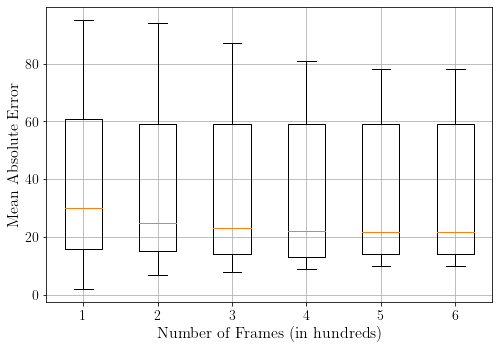

In [21]:
data = [[2,16,30,61,95],[7,15,25,59,94],[8,14,23,59,87],[9,13,22,59,81],[10,14,21.7,59,78],[10,14,21.7,59,78]]#,[],[],[]]
plt.xlabel(" Number of Frames (in hundreds)")
plt.ylabel("Mean Absolute Error")
plt.boxplot(data)
plt.grid()
plt.savefig("boxes5.pdf", format="pdf", bbox_inches="tight")

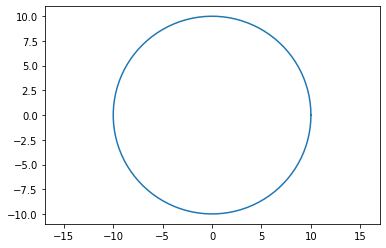

In [4]:
import numpy as np
import matplotlib.pyplot as plt

def draw_circle(radius):
    t = np.linspace(0, 2 * np.pi, 100)
    x = radius * np.cos(t)
    y = radius * np.sin(t)

    plt.plot(x, y)
    plt.axis('equal')

    plt.savefig("circle.pdf")

draw_circle(10)

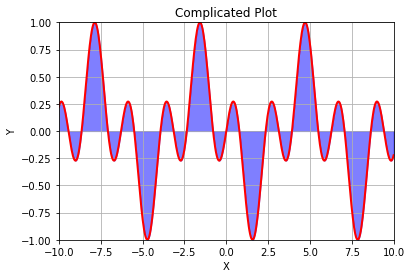

In [6]:
import numpy as np
import matplotlib.pyplot as plt

def draw_complex_plot():
    x = np.linspace(-10, 10, 500)
    y = np.sin(x) * np.cos(2 * x)

    plt.plot(x, y, color='red', linewidth=2)
    plt.fill_between(x, y, color='blue', alpha=0.5)

    plt.xlim(-10, 10)
    plt.ylim(-1, 1)
    plt.xlabel("X")
    plt.ylabel("Y")
    plt.title("Complicated Plot")
    plt.grid(True)

    plt.savefig("comp.pdf")

draw_complex_plot()


In [7]:
import numpy as np

# Define the mesh resolution
N = 20

# Define the domain bounds
x0, x1 = 0, 1
y0, y1 = 0, 1

# Generate a 2D mesh grid
X, Y = np.meshgrid(np.linspace(x0, x1, N + 1), np.linspace(y0, y1, N + 1))

# Get the number of nodes in the mesh
num_nodes = (N + 1) ** 2

# Store the node coordinates as a 2D array
nodes = np.zeros((num_nodes, 2))
nodes[:, 0] = X.flatten()
nodes[:, 1] = Y.flatten()

# Get the number of elements in the mesh
num_elements = N ** 2

# Store the element connectivity information as a 2D array
element_connectivity = np.zeros((num_elements, 4), dtype=np.int)
for i in range(N):
    for j in range(N):
        element_idx = i * N + j
        node_idx = i * (N + 1) + j
        element_connectivity[element_idx, 0] = node_idx
        element_connectivity[element_idx, 1] = node_idx + 1
        element_connectivity[element_idx, 2] = node_idx + N + 2
        element_connectivity[element_idx, 3] = node_idx + N + 1

C:\Users\USER\AppData\Local\Temp\ipykernel_16576\1923653320.py:25: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  element_connectivity = np.zeros((num_elements, 4), dtype=np.int)


In [8]:
print(element_connectivity)

[[  0   1  22  21]
 [  1   2  23  22]
 [  2   3  24  23]
 ...
 [416 417 438 437]
 [417 418 439 438]
 [418 419 440 439]]


In [13]:
from music21 import *

# Create a stream
s = stream.Stream()

# Define the key and time signature
s.insert(key.KeySignature(0))
s.insert(meter.TimeSignature('4/4'))

# Generate some notes
n1 = note.Note('C4', type='quarter')
n2 = note.Note('D4', type='quarter')
n3 = note.Note('E4', type='quarter')
n4 = note.Note('F4', type='quarter')

# Add the notes to the stream
s.append(n1)
s.append(n2)
s.append(n3)
s.append(n4)

# Generate a MIDI file from the stream
mf = midi.translate.music21ObjectToMidiFile(s)
mf.open('simple_music.mp4', 'wb')
mf.write()
mf.close()


In [10]:
pretty_data = json.dumps(coco_dataset,indent=4)
print(pretty_data)

{
    "info": {
        "year": 2022,
        "version": "0.1.0",
        "description": "This is the TEST dataset for k-fold cross validation",
        "url": "",
        "date_created": 1655378973864
    },
    "categories": [
        {
            "id": 1,
            "datatorch_id": "70ef714c-1f01-4409-90f0-fa67716cf68d",
            "name": "sheep_from_above",
            "supercategory": null
        }
    ],
    "images": [
        {
            "id": 0,
            "datatorch_id": "347a786b-90e8-46f0-9f4e-103333db5950",
            "storage_id": "4f48f1f9-bff9-413e-8047-13cac89d5909",
            "path": "DJI_0699.JPG",
            "width": 4000,
            "height": 3000,
            "file_name": "DJI_0699.JPG",
            "metadata": {},
            "date_captured": "2022-05-19T13:36:12.672Z"
        },
        {
            "id": 1,
            "datatorch_id": "23f5400d-c861-4485-b550-3ff58db1f8b9",
            "storage_id": "4f48f1f9-bff9-413e-8047-13cac89d5909",
        

3198
Average area: 4413.223089430891


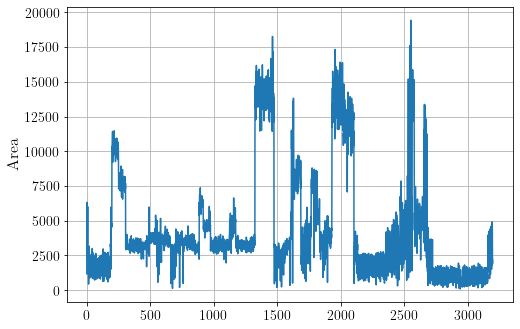

In [13]:
# Getting the average area of sheep in an import json
import json
# Load the COCO dataset JSON file
with open("E:\Downloads\hard_train_V3.json", 'r') as f:
    coco_dataset = json.load(f)

# Get the "annotations" list from the dataset
annotations = coco_dataset['annotations']

# Calculate the average area
total_area = 0
all = []
count = 0

for annotation in annotations:
    count+=1
    total_area += annotation['area']
    all.append(annotation['area'])

print(count)
average_area = total_area / len(annotations)

print('Average area:', average_area)
plt.plot(all)

# # Plotting prob of lowest error
# min_error_LDPS = min(LDPS_errors)
# min_prob_LDPS = probs[LDPS_errors.index(min_error_LDPS)]
# plt.scatter(min_prob_LDPS,min_error_LDPS,label="Optimal Prop", marker="o",c = 'g')

# plt.plot(scales,skl_scale_errors,label='skl')
plt.xlabel("")
plt.ylabel("Area")
#plt.legend()
plt.grid()
plt.savefig("area_op_sheep.pdf", format="pdf", bbox_inches="tight")


In [14]:
print(count)

3198


### Getting the area of object of interest

In [15]:
print(count*average_area) 

14113487.43999999


In [16]:
total_area = 126*3000*4000
animal_area = count*average_area

print(animal_area*100/total_area)
#Less than one percent of the imagery contain the object of interest 


0.9334317089947084
